# IE 360 Project - Group 8 - SPRING'24
*Contributors*
- Berat Kubilay Güngez - 2021402087
- Ebrar Baştan - 2020402078


## Table of Contents
1. [Introduction](#introduction)
2. [Related Literature](#RelatedLiterature)
3. [Approach and Results](#ApproachandResults)
    * 3a. [Data Inspection & Manipulation](#3a)
    * 3b. [Model Building](#3b)
        * 3b. [Part I - ARIMA Model](#3b1)
        * 3b. [Part II - Penalized Regression Model](#3b2)
        * 3b. [Model III - Lasso Regression & ARIMA](#3b3)
        * 3b. [Model IV - Combined Model & Monthly Dummy Variables](#3b4)
        * 3b. [Additional Model - Hourly Model](#3b5)
4. [Comparison](#comp)
5. [Conclusions and Future Work](#future)
6. [Code](#code)

## 1. Introduction <a name="introduction"></a>
Solar energy is one of the cleanest renewable energy sources and it's produced in solar power plants. Using it as a resource is very crucial in terms of sustainability; however, the production rate of solar energy is highly influenced by external factors. Weather effects such as cloud amounts during the day, the presence of snow, and temperature affect production a lot. These changes in solar energy production can lead to fluctuations or shortages in the energy supply of the energy chain, so the chain should be protected against it. Building an efficient forecasting model is important at that point and this project aims it. Different forecasting models for Edikli GES which is located in Niğde, Turkey will be constructed and compared. The geographical coordinates of the plant are between 37.75-38.75 north latitude and 34.5-35.5 east longitude. Production data and weather data from earlier periods are given to help build the models, and the objective is to make hourly forecasts for two days ahead. Different models will be tried to build with different techniques and compared according to error metrics. The built models and the approach used will be described in detail in the Approach section.

## 2. Related Literature <a name="RelatedLiterature"></a>

Different forecasting techniques and ways to reach problems are discussed throughout the course. Therefore, the main source is the lecture notes. Other than these, an additional source. to learn more about ARIMA is used. The website can be found in this [link](https://otexts.com/fpp2/). These are the resources in the theoretical part. While applying these theoretical knowledge to Python, additonal knowledge is needed. The website used for this can be found [here](https://scikit-learn.org/stable/modules/linear_model.html).

## 3. Approach and Results <a name="ApproachandResults"></a>
First of all, packages which will be used is imported and a function to calculate error metrics is builded. Error metrics that will be used are coefficient of variation (CV), forecast bias (FBias), mean absolute percentage error (MAPE), root mean squared error (RMSE), mean absolute deviation (MAD), mean absolute deviation percentage (MADP), and weighted mean absolute percentage error (WMAPE).

### Imports
First of all, packages which will be used is imported and a function to calculate error metrics is builded. Error metrics that will be used are coefficient of variation (CV), forecast bias (FBias), mean absolute percentage error (MAPE), root mean squared error (RMSE), mean absolute deviation (MAD), mean absolute deviation percentage (MADP), and weighted mean absolute percentage error (WMAPE).

In [1]:
import pandas as pd # To work with dataset
import numpy as np # To do some math
import matplotlib.pyplot as plt # To plot the data
from sklearn.preprocessing import MinMaxScaler # To scale the data
from statsmodels.tsa.stattools import acf # To plot autocorrelations
from statsmodels.tsa.stattools import pacf # To plot partial autocorrelations
import pmdarima as pm # To find the best ARIMA model
from sklearn.linear_model import LassoCV # To choose the best alpha
from sklearn.linear_model import Lasso # To build the Lasso Model
import statsmodels.api as sm # To build the models
import seaborn as sns # To plot the data

In [2]:
# Error metrics
def accu(actual, forecast):
    error = actual - forecast
    mean = np.mean(actual)
    sd = np.std(actual)
    CV = sd / mean # Coefficient of Variation
    FBias = np.sum(error) / np.sum(actual) # Forecast Bias
    MAPE = np.sum(np.abs(error / (actual+1))) / len(actual) # Mean Absolute Percentage Error
    RMSE = np.sqrt(np.sum(error ** 2) / len(actual)) # Root Mean Squared Error
    MAD = np.sum(np.abs(error)) / len(actual) # Mean Absolute Deviation
    MADP = np.sum(np.abs(error)) / np.sum(np.abs(actual)) # Mean Absolute Deviation Percentage
    WMAPE = MAD / mean # Weighted Mean Absolute Percentage Error
    
    # Formatting the results
    result_dict = {
        "n": len(actual),
        "mean": mean,
        "sd": sd,
        "CV": CV,
        "FBias": FBias,
        "MAPE": MAPE,
        "RMSE": RMSE,
        "MAD": MAD,
        "MADP": MADP,
        "WMAPE": WMAPE
    }
    
    return pd.DataFrame(result_dict, index=[0])

### 3a. Data Inspection & Manipulation <a name="3a"></a>
Production and weather data are available in csv files. Before starting, preprocessing is necessary. Firstly, data is read from the csv files and some operations are done to prepare them.

In [3]:
# Set the location of the data
production_data_loc = "data/production.csv"
weather_data_loc = "data/processed_weather.csv"

As can be seen below, production above 10 is rescaled to 10. This transformation is done because of real-life regulations.

In [4]:
# Load the production data
production_df = pd.read_csv(production_data_loc)
production_df["date"] = pd.to_datetime(production_df["date"])
production_df = production_df.iloc[4:] # Remove the first 4 rows which are not in weather data
production_df = production_df.drop_duplicates() # Remove duplicates
production_df.reset_index(drop=True, inplace=True) # Reset the index
# Set the maximum production to 10 because the production is capped at 10 in the real world
production_df["production"] = production_df["production"].apply(lambda x: 10 if x > 10 else x) 

production_df

,date,hour,production
0,2022-01-01,4,0.0
1,2022-01-01,5,0.0
2,2022-01-01,6,0.0
3,2022-01-01,7,0.0
4,2022-01-01,8,3.4
...,...,...,...
20967,2024-05-23,19,0.0
20968,2024-05-23,20,0.0
20969,2024-05-23,21,0.0
20970,2024-05-23,22,0.0


In [5]:
# Load the weather data
weather_df = pd.read_csv(weather_data_loc) 
weather_df["date"] = pd.to_datetime(weather_df["date"], format='%Y-%m-%d') # Convert the date to datetime
weather_df = weather_df.sort_values(by=['date', 'hour']) # Sort the data by date and hour
weather_df.reset_index(drop=True, inplace=True) # Reset the index

weather_df

,date,hour,lat,lon,dswrf_surface,tcdc_low.cloud.layer,tcdc_middle.cloud.layer,tcdc_high.cloud.layer,tcdc_entire.atmosphere,uswrf_top_of_atmosphere,csnow_surface,dlwrf_surface,uswrf_surface,tmp_surface
0,2022-01-01,4,38.00,34.75,0.000,3.0,5.0,7.2,15.1,0.000,0.0,225.079,0.000,269.004
1,2022-01-01,4,38.75,35.50,0.000,1.4,0.1,5.0,6.7,0.000,0.0,232.479,0.000,271.204
2,2022-01-01,4,38.00,35.25,0.000,0.0,5.1,4.1,10.6,0.000,0.0,209.479,0.000,265.004
3,2022-01-01,4,38.50,34.75,0.000,3.0,0.0,5.0,11.4,0.000,0.0,229.579,0.000,270.804
4,2022-01-01,4,38.75,34.50,0.000,5.0,0.0,5.0,14.7,0.000,0.0,241.779,0.000,271.404
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
527245,2024-05-28,21,38.25,34.50,278.144,51.4,6.1,0.0,52.2,145.312,0.0,314.501,54.592,283.700
527246,2024-05-28,21,38.00,34.75,340.848,0.7,0.0,0.0,0.7,101.184,0.0,293.701,69.440,284.700
527247,2024-05-28,21,38.75,34.75,284.224,18.1,0.0,0.7,19.2,140.672,0.0,330.601,61.568,287.400
527248,2024-05-28,21,38.25,35.25,290.560,35.1,1.1,0.0,35.6,128.304,0.0,326.601,61.632,288.300


In [6]:
# Pivot the weather data
columns_to_pivot = weather_df.columns[4:] # Get the columns to pivot

for col in columns_to_pivot:
    weather_df[f'{col}_identifier'] = col + "_" + weather_df['lat'].astype(str) + "_" + weather_df['lon'].astype(str)

pivoted_dfs = []
for col in columns_to_pivot:
    pivoted_df = pd.pivot(
        weather_df,
        index=['date', 'hour'],
        columns=f'{col}_identifier',
        values=col
    )
    pivoted_df.columns.name = None 
    pivoted_df.reset_index(inplace=True)  
    pivoted_dfs.append(pivoted_df)

result_df = pivoted_dfs[0]
for df in pivoted_dfs[1:]:
    result_df = result_df.merge(df, on=['date', 'hour'], how='outer') 
    
df = result_df.iloc[:, :252] # Remove the identifier columns

df

,date,hour,dswrf_surface_37.75_34.5,dswrf_surface_37.75_34.75,dswrf_surface_37.75_35.0,dswrf_surface_37.75_35.25,dswrf_surface_37.75_35.5,dswrf_surface_38.0_34.5,dswrf_surface_38.0_34.75,dswrf_surface_38.0_35.0,...,tmp_surface_38.5_34.5,tmp_surface_38.5_34.75,tmp_surface_38.5_35.0,tmp_surface_38.5_35.25,tmp_surface_38.5_35.5,tmp_surface_38.75_34.5,tmp_surface_38.75_34.75,tmp_surface_38.75_35.0,tmp_surface_38.75_35.25,tmp_surface_38.75_35.5
0,2022-01-01,4,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,271.404,270.804,270.504,271.204,262.204,271.404,271.404,270.904,270.304,271.204
1,2022-01-01,5,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,271.304,270.804,270.604,271.104,262.004,271.304,271.204,270.804,270.104,271.104
2,2022-01-01,6,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,271.331,270.831,270.531,270.931,262.031,271.231,271.131,270.731,270.031,271.131
3,2022-01-01,7,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,271.217,270.817,270.517,270.917,262.317,271.217,271.117,270.717,270.017,271.217
4,2022-01-01,8,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,271.194,270.894,270.594,270.894,263.394,271.194,271.094,270.594,269.894,270.994
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21085,2024-05-28,17,669.480,681.480,691.380,569.620,489.000,699.540,697.620,692.880,...,294.225,292.725,296.525,292.825,289.125,296.725,297.825,296.925,296.725,297.025
21086,2024-05-28,18,582.380,582.560,596.280,511.620,438.240,604.260,602.320,598.100,...,293.000,291.500,292.100,292.200,288.300,294.500,294.200,293.100,293.700,294.200
21087,2024-05-28,19,487.648,487.184,496.464,422.736,361.488,503.520,502.560,498.960,...,290.453,289.553,289.553,288.753,285.953,292.053,291.753,290.453,290.153,290.153
21088,2024-05-28,20,397.200,396.592,403.648,343.472,293.616,409.856,409.008,405.776,...,286.100,285.800,286.300,285.700,282.200,288.500,288.100,288.200,289.900,286.800


On the 12th of May 2024, production data is given as 0 in the data. Since this is probably an error in the data, this date's data is dropped.

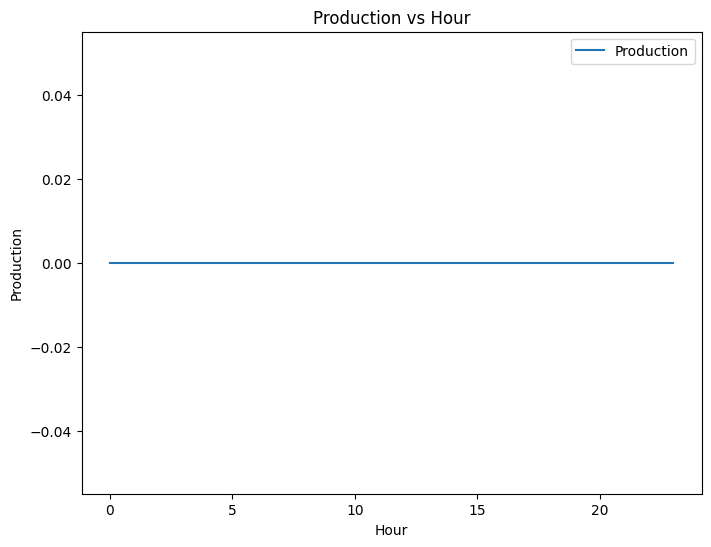

In [7]:
date = pd.to_datetime("2024-05-12")

specific_production = production_df[production_df["date"] == date]

plt.figure(figsize=(8, 6))
plt.plot(specific_production["hour"], specific_production["production"], label="Production")
plt.xlabel("Hour")
plt.ylabel("Production")
plt.title("Production vs Hour")
plt.legend()
plt.show()

df = df[df["date"] != date]
production_df = production_df[production_df["date"] != date]

Production and weather data frames are combined below.

In [8]:
# Get the data that matches with the production data
end_date = production_df["date"].iloc[-1]
end_hour = production_df["hour"].iloc[-1]

df_copy = df.copy() # To keep the original data and in case we need it later

cut_off_index = df[(df["date"] == end_date) & (df["hour"] == end_hour)].index.min() 
df = df.loc[:cut_off_index]
df = pd.merge(df, production_df, on=["date", "hour"], how = "inner") # Merge the production data with the weather data
df.ffill(inplace=True) # Fill the missing values with the previous value if there is any

df

,date,hour,dswrf_surface_37.75_34.5,dswrf_surface_37.75_34.75,dswrf_surface_37.75_35.0,dswrf_surface_37.75_35.25,dswrf_surface_37.75_35.5,dswrf_surface_38.0_34.5,dswrf_surface_38.0_34.75,dswrf_surface_38.0_35.0,...,tmp_surface_38.5_34.75,tmp_surface_38.5_35.0,tmp_surface_38.5_35.25,tmp_surface_38.5_35.5,tmp_surface_38.75_34.5,tmp_surface_38.75_34.75,tmp_surface_38.75_35.0,tmp_surface_38.75_35.25,tmp_surface_38.75_35.5,production
0,2022-01-01,4,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,270.804,270.504,271.204,262.204,271.404,271.404,270.904,270.304,271.204,0.0
1,2022-01-01,5,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,270.804,270.604,271.104,262.004,271.304,271.204,270.804,270.104,271.104,0.0
2,2022-01-01,6,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,270.831,270.531,270.931,262.031,271.231,271.131,270.731,270.031,271.131,0.0
3,2022-01-01,7,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,270.817,270.517,270.917,262.317,271.217,271.117,270.717,270.017,271.217,0.0
4,2022-01-01,8,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,270.894,270.594,270.894,263.394,271.194,271.094,270.594,269.894,270.994,3.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20943,2024-05-23,19,417.232,415.040,470.176,461.136,317.344,407.552,459.744,487.328,...,288.409,291.109,291.209,287.109,288.709,291.709,294.209,294.809,294.809,0.0
20944,2024-05-23,20,339.168,337.536,381.040,372.608,258.112,328.048,371.328,393.680,...,287.100,287.000,289.200,284.100,289.700,289.500,288.100,290.200,291.800,0.0
20945,2024-05-23,21,282.640,281.280,317.520,310.512,215.088,273.360,309.440,328.064,...,287.200,287.000,285.700,284.400,290.300,290.000,288.300,287.800,287.300,0.0
20946,2024-05-23,22,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,288.700,287.700,285.400,284.100,289.300,289.200,287.400,287.600,287.700,0.0


To understand the production data before any operation, autocorrelation within itself is plotted.

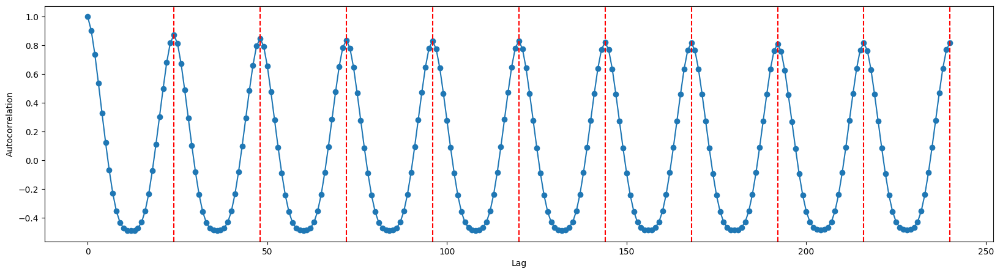

In [9]:
# Plot the autocorrelation of the production data
acf_values = acf(df["production"], nlags=24*10)
plt.figure(figsize=(20, 5))
plt.plot(range(len(acf_values)), acf_values, marker='o', linestyle='-')
for i in range(1, 11):
    plt.axvline(x=24*i, color='red', linestyle='--')
plt.xlabel("Lag")
plt.ylabel("Autocorrelation")
plt.show()

As it can be seen from above, production data has high autocorrelation and it seems autocorrelation has a seasonal pattern. Lags which are shown with red lines  have the peaks. It is lag 24 and its multiplicatives. It's expected to have high autocorrelation at the same hour in every day because of the weather conditions such as temperature and sunlight. Thus, it's a reasonable result.

In [10]:
# Let us inspect a single location to understand the data
specific_loc = [col for col in df.columns if '38.0_34.5' in col]
extra_columns = ["production"]
df_filtered = pd.concat([df[extra_columns],df[specific_loc]], axis=1)

df_filtered

,production,dswrf_surface_38.0_34.5,tcdc_low.cloud.layer_38.0_34.5,tcdc_middle.cloud.layer_38.0_34.5,tcdc_high.cloud.layer_38.0_34.5,tcdc_entire.atmosphere_38.0_34.5,uswrf_top_of_atmosphere_38.0_34.5,csnow_surface_38.0_34.5,dlwrf_surface_38.0_34.5,uswrf_surface_38.0_34.5,tmp_surface_38.0_34.5
0,0.0,0.000,0.0,5.0,7.6,14.0,0.000,0.0,226.179,0.000,268.204
1,0.0,0.000,1.3,4.9,23.6,29.1,0.000,0.0,226.026,0.000,268.104
2,0.0,0.000,1.7,4.1,30.7,35.6,0.000,0.0,225.800,0.000,267.931
3,0.0,0.000,1.9,4.3,40.6,46.0,0.000,0.0,226.148,0.000,268.117
4,3.4,0.000,2.1,4.5,40.0,46.6,0.000,0.0,226.145,0.000,267.994
...,...,...,...,...,...,...,...,...,...,...,...
20943,0.0,407.552,1.8,44.7,23.7,45.6,206.928,0.0,341.392,74.800,292.409
20944,0.0,328.048,3.9,47.4,36.4,54.7,175.312,0.0,344.946,60.272,289.700
20945,0.0,273.360,8.8,54.3,43.5,62.2,146.080,0.0,347.346,50.240,287.900
20946,0.0,0.000,0.0,2.6,87.2,87.2,0.000,0.0,301.764,0.000,286.600


To understand which variables affect the production amount the most, correlation matrix is printed.

In [11]:
# Print the correlation matrix
df_filtered.corr()

,production,dswrf_surface_38.0_34.5,tcdc_low.cloud.layer_38.0_34.5,tcdc_middle.cloud.layer_38.0_34.5,tcdc_high.cloud.layer_38.0_34.5,tcdc_entire.atmosphere_38.0_34.5,uswrf_top_of_atmosphere_38.0_34.5,csnow_surface_38.0_34.5,dlwrf_surface_38.0_34.5,uswrf_surface_38.0_34.5,tmp_surface_38.0_34.5
production,1.000000,0.602806,-0.169203,-0.218731,-0.138377,-0.217157,0.358575,-0.100748,0.020937,0.516562,0.531894
dswrf_surface_38.0_34.5,0.602806,1.000000,-0.145427,-0.189573,-0.160620,-0.199366,0.649627,-0.084242,0.214118,0.841934,0.698949
tcdc_low.cloud.layer_38.0_34.5,-0.169203,-0.145427,1.000000,0.486816,0.108026,0.607934,0.281135,0.544634,0.188494,-0.033522,-0.275991
tcdc_middle.cloud.layer_38.0_34.5,-0.218731,-0.189573,0.486816,1.000000,0.492768,0.714380,0.184370,0.294590,0.261409,-0.135656,-0.206837
tcdc_high.cloud.layer_38.0_34.5,-0.138377,-0.160620,0.108026,0.492768,1.000000,0.718796,0.048605,0.059755,0.056998,-0.140608,-0.183636
tcdc_entire.atmosphere_38.0_34.5,-0.217157,-0.199366,0.607934,0.714380,0.718796,1.000000,0.221062,0.330721,0.138677,-0.107047,-0.314578
uswrf_top_of_atmosphere_38.0_34.5,0.358575,0.649627,0.281135,0.184370,0.048605,0.221062,1.000000,0.115868,0.248971,0.720640,0.331322
csnow_surface_38.0_34.5,-0.100748,-0.084242,0.544634,0.294590,0.059755,0.330721,0.115868,1.000000,-0.008231,0.023359,-0.241555
dlwrf_surface_38.0_34.5,0.020937,0.214118,0.188494,0.261409,0.056998,0.138677,0.248971,-0.008231,1.000000,-0.002359,0.673935
uswrf_surface_38.0_34.5,0.516562,0.841934,-0.033522,-0.135656,-0.140608,-0.107047,0.720640,0.023359,-0.002359,1.000000,0.398708


The production amount is correlated with dswrf_surface variable the most. Uswrf_surface, tmp_surface, and uswrf_top_atmosphere are also positively correlated with it. Cloud layer variables ( low, middle and high) and tcdc_entire.atmosphere are negatively correlated with it, but their values are lower than the positive ones in absolute sense. Other than these, cloud variables have high (more than 0.6) correlation with tcdc_entire.atmosphere and temperature variable has high correlation with radiation variables dswrf_surface and dlwrf_surface. These high correlations can lead to multicollinearity in the model. In model building process, this needs to be considered.

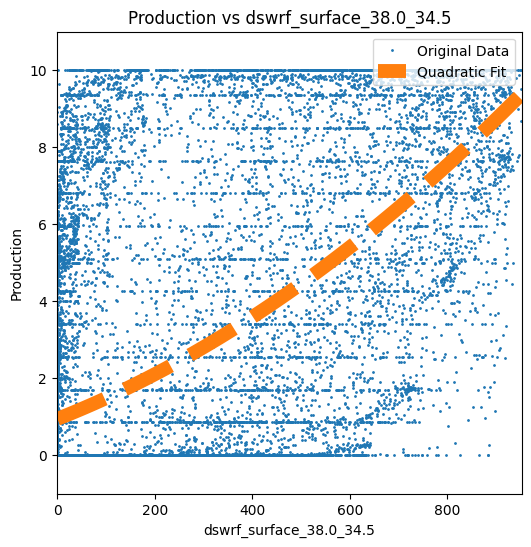

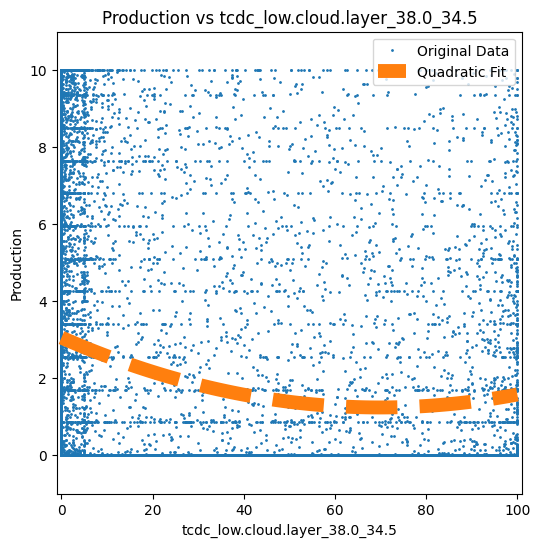

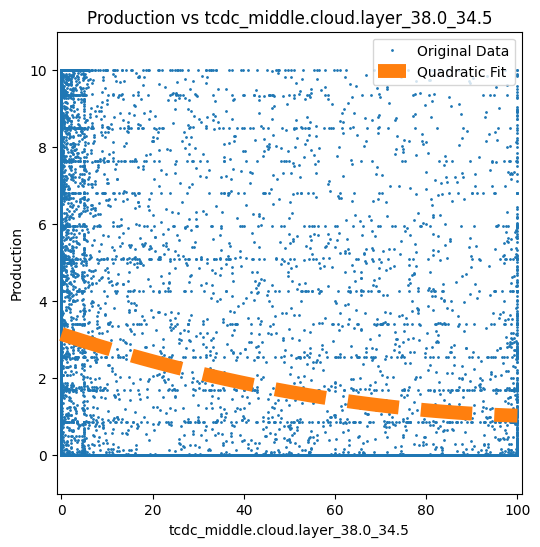

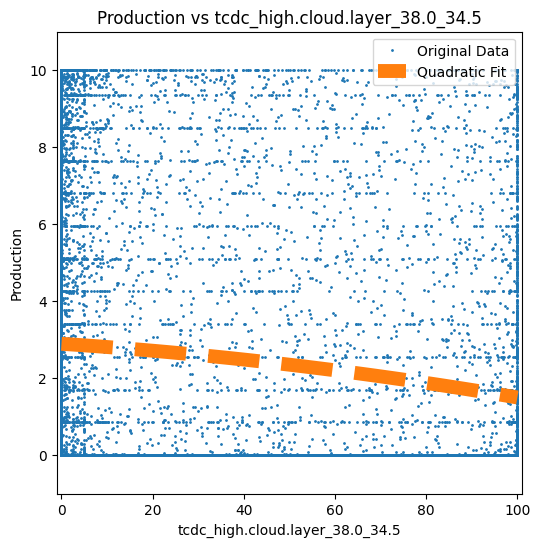

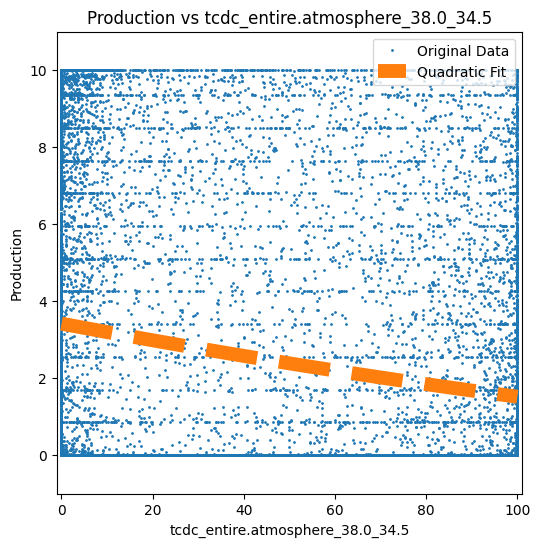

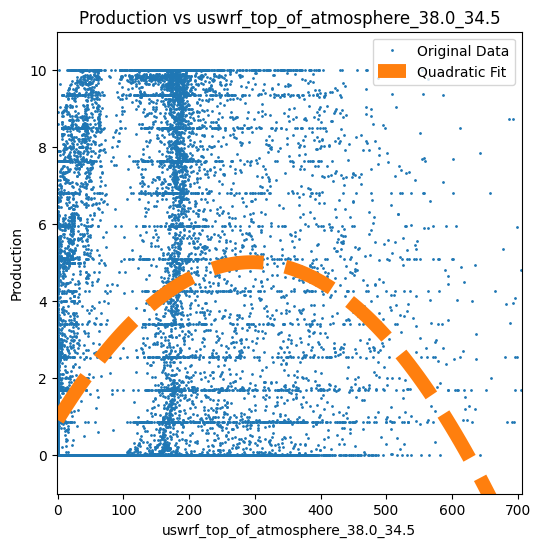

/var/folders/mk/yzmswp8x76g_k99y3jccgr0c0000gn/T/ipykernel_4044/3754004380.py:8: RankWarning: Polyfit may be poorly conditioned
  coeffs = np.polyfit(x, y, 2)


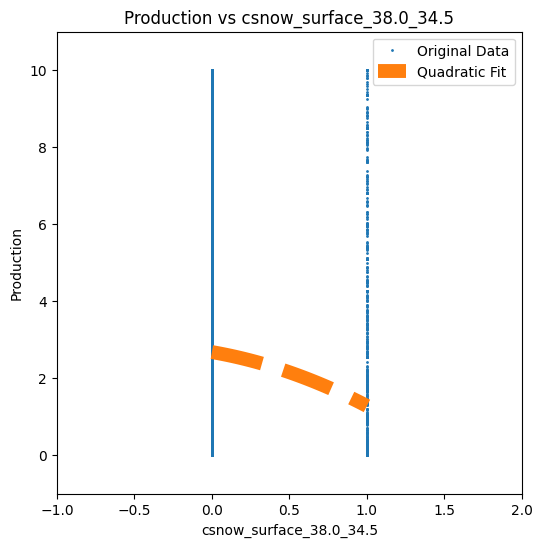

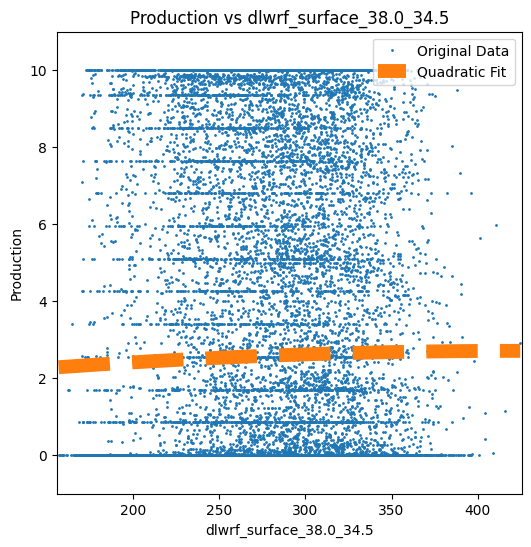

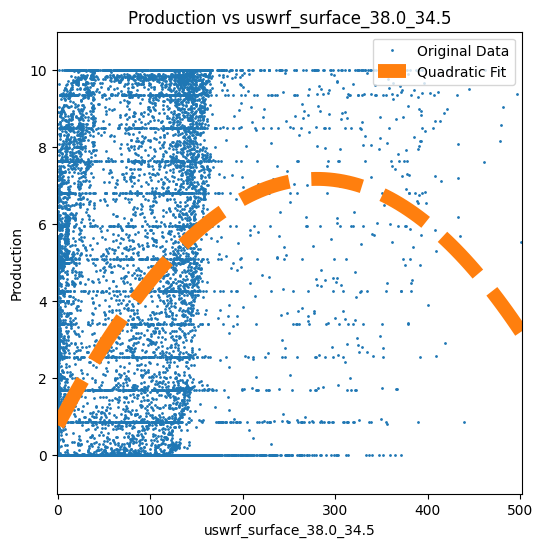

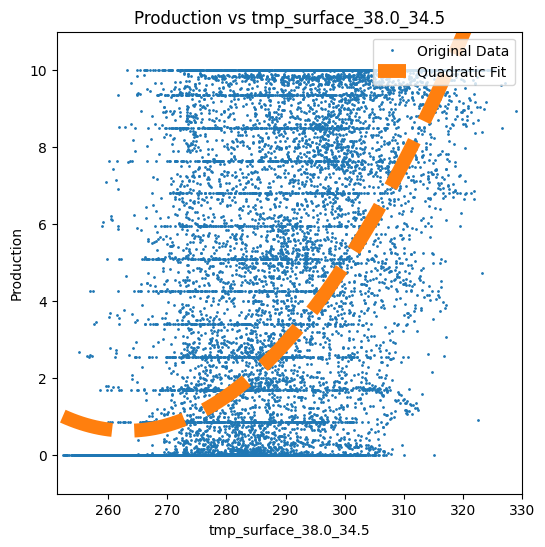

In [12]:
# Plot the data compared to the production
plt_lst = df_filtered.columns[1:]

for col in plt_lst:
    y = df_filtered["production"]
    x = df_filtered[col]

    coeffs = np.polyfit(x, y, 2)
    poly_func = np.poly1d(coeffs)
    
    x_fit = np.linspace(min(x), max(x), 100)  
    y_fit = poly_func(x_fit)  

    plt.figure(figsize=(6, 6))
    plt.plot(x, y, 'o', label='Original Data', markersize=1)  
    plt.plot(x_fit, y_fit, '--', label='Quadratic Fit', linewidth=10)  
    plt.title(f"Production vs {col}")
    plt.xlabel(col)
    plt.ylabel("Production")
    plt.xlim([min(x) - 1, max(x) + 1])  # Adjust as needed
    plt.ylim([min(y) - 1, max(y) + 1])  # Adjust as needed
    plt.legend(loc ="upper right")
    plt.show()

Pairwise relations with production data are plotted to observe relation patterns to build the model, but a clear pattern could not be found. Even though the quadratic fit function finds patterns in these, they don't seem to be observable.

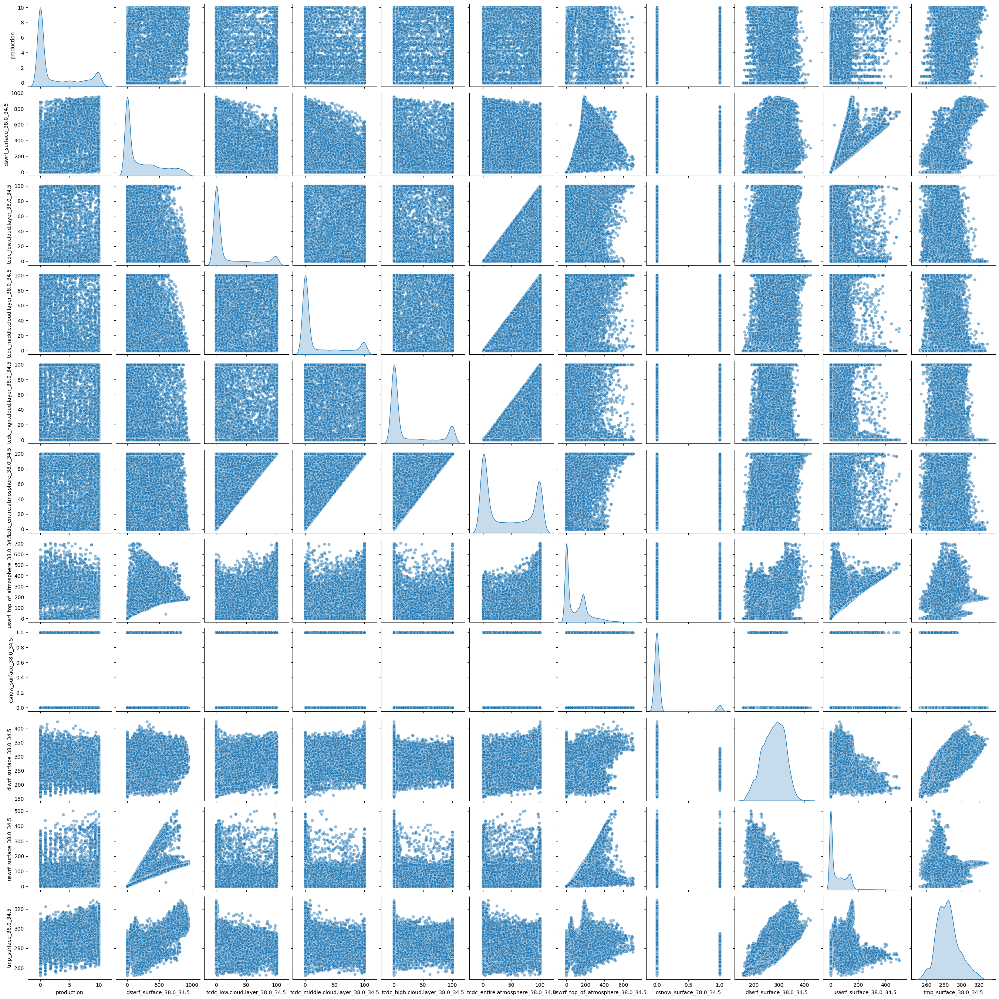

In [13]:
# Plot pairwise relationships in the dataset
pair_plot = sns.pairplot(df_filtered, kind='scatter', diag_kind='kde', markers='o', plot_kws={'alpha':0.5})
plt.show()

The production data is scaled to have values between 0 and 10 as a preprocessing step. This is done because of production data is between to 0 to 10.

In [14]:
# Scale the data
scaler = MinMaxScaler(feature_range=(0, 10)) # Scale the data between 0 and 10
columns_to_scale = df.columns[2:] # Do not scale the date and hour columns

df.loc[:, columns_to_scale] = scaler.fit_transform(df.loc[:, columns_to_scale])

Relations were not clear in the plots above, so the data is decomposed to see and understand trend, seasonality, and remainder components. As can be seen, since data is too long, only the last 1000 data points are plotted.

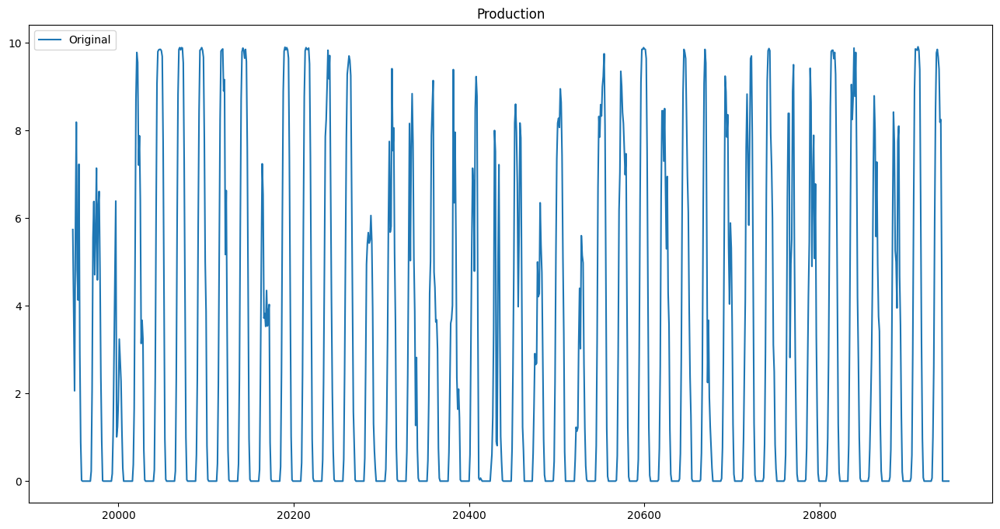

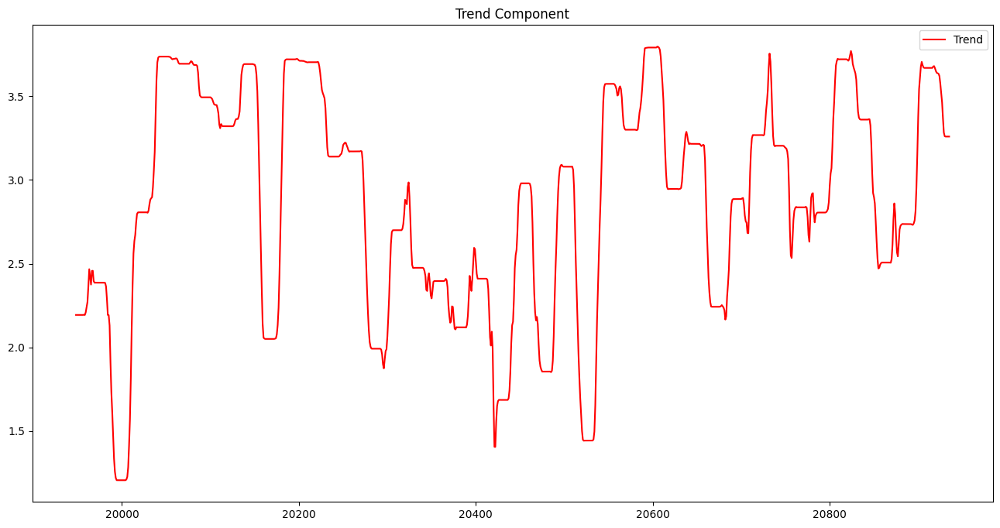

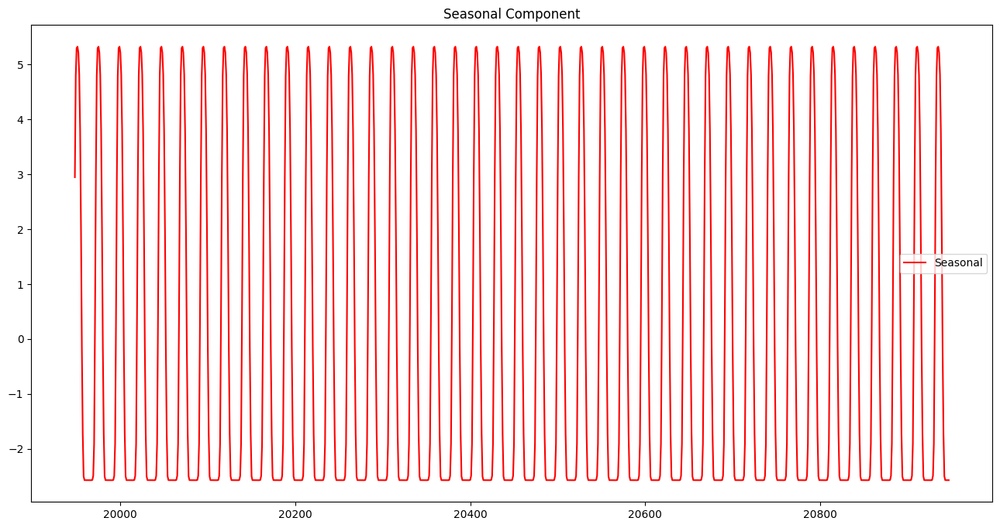

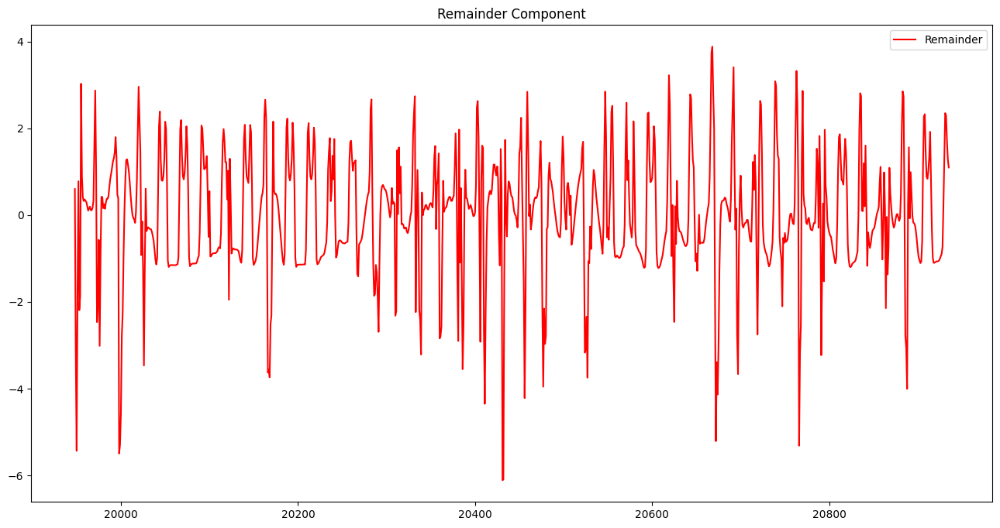

In [15]:
production = df["production"]

production

# Decompose the data to understand the trend, seasonal and remainder components
decomposition = sm.tsa.seasonal_decompose(production, model='additive', period=24) # Period is 24 because the seasonality seems to be hourly

trend = decomposition.trend
seasonal = decomposition.seasonal
remainder = decomposition.resid

plt.figure(figsize=(16, 8))
plt.plot(production[-1000:], label='Original')
plt.legend(loc='best')
plt.title('Production')
plt.show()

plt.figure(figsize=(16, 8))
plt.plot(trend[-1000:], label='Trend', color='red')
plt.legend(loc='best')
plt.title('Trend Component')
plt.show()

plt.figure(figsize=(16, 8))
plt.plot(seasonal[-1000:], label='Seasonal', color='red')
plt.legend(loc='best')
plt.title('Seasonal Component')
plt.show()

plt.figure(figsize=(16, 8))
plt.plot(remainder[-1000:], label='Remainder', color='red')
plt.legend(loc='best')
plt.title('Remainder Component')
plt.show()


The data is definitely seasonal as it's observed beforehand. It has a somewhat changing trend, but it is not that clear. Also, the remainder component seems to have a stable mean but some points have too low values than others which may affect variance. It does not seem to have a complete white noise series pattern.

### 3b. Model Building <a name="3b"></a>
The production data from previous years are given, and they will be used for training purposes. 2022 and 2023 data is used for training and test data starts at February 2024. The data is splitted as test and train groups to observe performance before deciding which model to use and submitting forecasts.

In [16]:
train_test_split_date = pd.to_datetime("2024-02-01")

df_train= df[df['date'] < train_test_split_date] # 2022 and 2023 data is used for training

df_train

,date,hour,dswrf_surface_37.75_34.5,dswrf_surface_37.75_34.75,dswrf_surface_37.75_35.0,dswrf_surface_37.75_35.25,dswrf_surface_37.75_35.5,dswrf_surface_38.0_34.5,dswrf_surface_38.0_34.75,dswrf_surface_38.0_35.0,...,tmp_surface_38.5_34.75,tmp_surface_38.5_35.0,tmp_surface_38.5_35.25,tmp_surface_38.5_35.5,tmp_surface_38.75_34.5,tmp_surface_38.75_34.75,tmp_surface_38.75_35.0,tmp_surface_38.75_35.25,tmp_surface_38.75_35.5,production
0,2022-01-01,4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.792751,2.563750,2.560073,2.381561,2.866957,2.738521,2.454569,2.315101,2.207942,0.0
1,2022-01-01,5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.792751,2.576989,2.546334,2.355981,2.854968,2.714355,2.441626,2.290149,2.194867,0.0
2,2022-01-01,6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.796341,2.567324,2.522566,2.359434,2.846216,2.705534,2.432177,2.281041,2.198397,0.0
3,2022-01-01,7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.794479,2.565471,2.520642,2.396015,2.844537,2.703842,2.430365,2.279294,2.209641,0.0
4,2022-01-01,8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.804718,2.575665,2.517483,2.533766,2.841780,2.701063,2.414445,2.263948,2.180485,3.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18255,2024-01-31,19,1.576039,1.070560,1.187324,0.862606,1.083381,1.712690,1.449336,1.104238,...,2.620830,2.458758,2.615989,2.344086,2.939731,2.715201,2.468418,2.428261,2.208857,0.0
18256,2024-01-31,20,1.260746,0.856532,0.950066,0.690044,0.866578,1.370194,1.159552,0.883349,...,2.626281,2.450947,2.607883,2.349330,2.896690,2.683905,2.460782,2.408424,2.201143,0.0
18257,2024-01-31,21,1.050692,0.713777,0.791618,0.575071,0.722254,1.141723,0.966154,0.736089,...,2.612586,2.437310,2.593732,2.323365,2.884341,2.683543,2.447450,2.395573,2.200750,0.0
18258,2024-01-31,22,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.599689,2.424467,2.580406,2.336539,2.884701,2.671822,2.434895,2.395948,2.201143,0.0


In [17]:
df_test = df[df['date'] >= train_test_split_date] # 2024 data is used for testing

df_test

,date,hour,dswrf_surface_37.75_34.5,dswrf_surface_37.75_34.75,dswrf_surface_37.75_35.0,dswrf_surface_37.75_35.25,dswrf_surface_37.75_35.5,dswrf_surface_38.0_34.5,dswrf_surface_38.0_34.75,dswrf_surface_38.0_35.0,...,tmp_surface_38.5_34.75,tmp_surface_38.5_35.0,tmp_surface_38.5_35.25,tmp_surface_38.5_35.5,tmp_surface_38.75_34.5,tmp_surface_38.75_34.75,tmp_surface_38.75_35.0,tmp_surface_38.75_35.25,tmp_surface_38.75_35.5,production
18260,2024-02-01,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.595966,2.394280,2.562820,2.332958,2.881344,2.680522,2.431271,2.404931,2.184407,0.0
18261,2024-02-01,1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.587456,2.399047,2.540289,2.324772,2.873671,2.672789,2.435931,2.384470,2.162964,0.0
18262,2024-02-01,2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.594902,2.393221,2.520505,2.319145,2.868395,2.679555,2.430236,2.378980,2.157211,0.0
18263,2024-02-01,3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.577085,2.375480,2.502095,2.276425,2.852330,2.675447,2.412892,2.349785,2.139691,0.0
18264,2024-02-01,4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.419923,2.218986,2.477091,2.227566,2.830510,2.677622,2.415221,2.339555,2.115895,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20943,2024-05-23,19,4.417397,4.350159,4.862816,4.725335,3.333375,4.279121,4.806142,5.068056,...,5.133561,5.291805,5.308503,5.566996,4.941673,5.192001,5.471007,5.372417,5.294248,0.0
20944,2024-05-23,20,3.590903,3.537817,3.940923,3.818174,2.711204,3.444363,3.881845,4.094146,...,4.959513,4.747782,5.032492,5.182134,5.060485,4.925085,4.680300,4.797385,4.900828,0.0
20945,2024-05-23,21,2.992419,2.948180,3.283965,3.181867,2.259280,2.870162,3.234871,3.411761,...,4.972809,4.747782,4.551637,5.220505,5.132420,4.985500,4.706187,4.497954,4.312462,0.0
20946,2024-05-23,22,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,5.172253,4.840461,4.510421,5.182134,5.012529,4.888835,4.589697,4.473001,4.364761,0.0


### 3b. Part I - ARIMA Model <a name="3b1"></a>
ARIMA is one of the forecasting techniques discussed in class and it works well, so it'll be the first model. Before trying to find ARIMA coefficients, differencing is done to stationarize the data. This will also decrease the time to find a proper ARIMA variable pair. Differencing will be done with lag 24 which corresponds to a day before at the same hour.

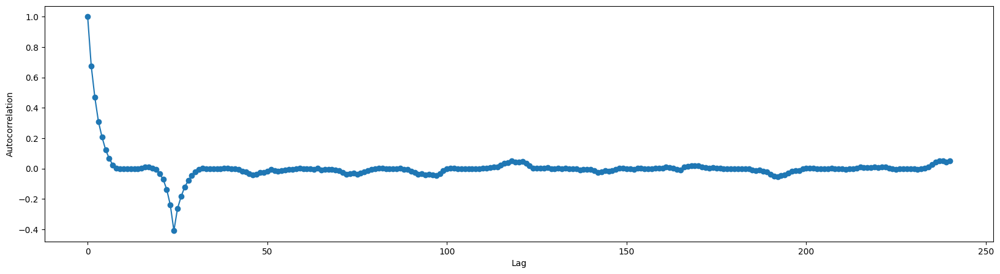

In [18]:
# Find the best ARIMA model of differenced data 
# This staionarizes the data and makes it easier to model
diff_24_production_test = [df_train["production"][i] - df_train["production"][i-24] for i in range(24, len(df_train["production"]))]

acf_values = acf(diff_24_production_test, nlags=24*10)
plt.figure(figsize=(20, 5))
plt.plot(range(len(acf_values)), acf_values, marker='o', linestyle='-')
plt.xlabel("Lag")
plt.ylabel("Autocorrelation")
plt.show()

Except from the first few observed data and the point where autocorrelation reaches -0.4, data have autocorrelation near 0 after differencing. The seasonal pattern is gone as it can be seen.

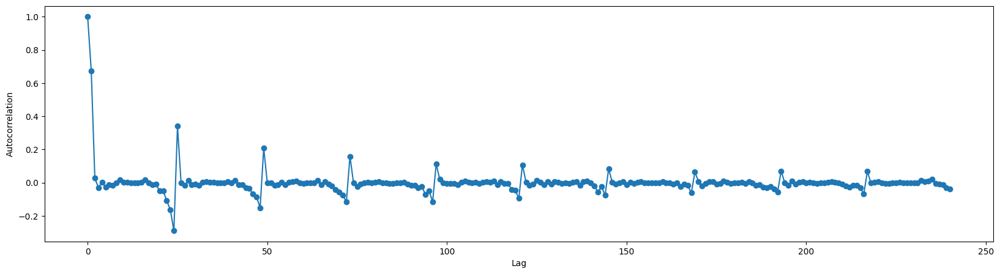

In [19]:
acf_values = pacf(diff_24_production_test, nlags=24*10)
plt.figure(figsize=(20, 5))
plt.plot(range(len(acf_values)), acf_values, marker='o', linestyle='-')
plt.xlabel("Lag")
plt.ylabel("Autocorrelation")
plt.show()

Partial autocorrelations seem to have a somewhat dampening seasonal pattern.

Autocorrelation and partial autocorrelation plots of differenced data indicate an ARIMA(2,0,0) model can work well. To find this model and observe other options, auto_arima is used.

In [20]:
# Find the best ARIMA model by using auto_arima
arima_model = pm.auto_arima(
    diff_24_production_test,
    # Limit differencing to 1 since the data is already differenced
    start_d=0, 
    max_d=1, 
    seasonal=False, # Seasonal is False because the data is already differenced
    stepwise=True,   
    trace=True,      
    error_action='ignore',  
    suppress_warnings=True, 
    max_order=None,     
    information_criterion='aic', # Use AIC to find the best model
)

best_arima = arima_model.fit(diff_24_production_test) # Fit the best ARIMA model

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62877.150, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=73947.896, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=62902.550, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=66633.340, Time=0.28 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=62879.114, Time=0.54 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62877.011, Time=0.99 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62892.816, Time=0.33 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=62891.773, Time=0.31 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62877.079, Time=1.04 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=62877.777, Time=0.40 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62878.949, Time=1.38 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=62879.010, Time=3.56 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0]          
Total fit time: 10.085 seconds


ARIMA coefficients are found with the auto_arima function. This algorithm does not guarantee an optimal therefore this result may not be the best p,d,q choice. But compared to our guess ARIMA(2,0,0), ARIMA(2,0,1)(which corresponds to 2 autoregressive terms and 1 moving average term) seems to be better in terms of AIC values. Therefore this result will be used in the following applications. 

In [21]:
best_arima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                18236
Model:               SARIMAX(2, 0, 1)   Log Likelihood              -31434.506
Date:                Wed, 05 Jun 2024   AIC                          62877.011
Time:                        12:59:48   BIC                          62908.256
Sample:                             0   HQIC                         62887.279
                              - 18236                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0167      0.078      0.214      0.831      -0.136       0.170
ar.L2          0.4600      0.051      8.983      0.000       0.360       0.560
ma.L1          0.6375      0.079      8.061      0.000       0.482       0.792
sigma2         1.8397      0.008    225.967      0.000       1.824       1.856
===================================================================================
Ljung-Box (L1) (Q):                   0.20   Jarque-Bera (JB):             66741.16
Prob(Q):                              0.65   Prob(JB):                         0.00
Heteroskedasticity (H):               0.69   Skew:                            -0.07
Prob(H) (two-sided):                  0.00   Kurtosis:                        12.37
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Other performance measures BIC and HQIC give 60331.923 and 30311.080 respectively.

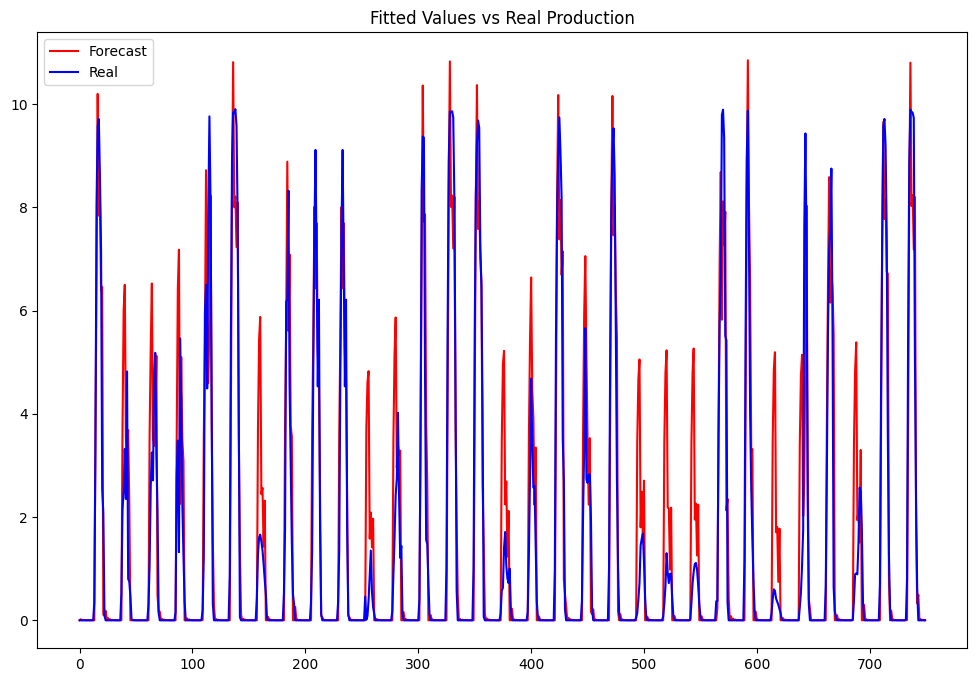

In [22]:
# Plot the results of the ARIMA model
forecasted_values = list(df["production"][:24])

for diff in list(best_arima.fittedvalues()):
    new_value = forecasted_values[-24] + diff
    forecasted_values.append(new_value)

forecasted_values = [max(0, i) for i in forecasted_values]

plt.figure(figsize=(12, 8))
plt.plot(range(len(df_train["production"][-750:])),forecasted_values[-750:], label="Forecast", c = "red")
plt.plot(range(len(df_train["production"][-750:])),df_train["production"][-750:], label="Real", c="blue")
plt.title("Fitted Values vs Real Production")
plt.legend(loc="best")
plt.show()

Forecasted and real production amounts are plotted together to visualize the situation better. Red ones represent forecasted ones and blue ones represent real values. At most of the time points, the ARIMA model overpredicts the production values. At some point, the gap seems to be too large, so the ARIMA model did not give good predictions as wanted in the train set but since this model is a starting point, this model is used to improve/build other models as well.

In [23]:
accu(df_train["production"], forecasted_values) # Calculate the error metrics

,n,mean,sd,CV,FBias,MAPE,RMSE,MAD,MADP,WMAPE
0,18260,2.565885,3.688927,1.437682,0.075443,0.213338,1.478055,0.808813,0.315218,0.315218


Error metrics are calculated and the results can be seen above. Although it seems the model overpredicts, the FBias value is positive, which means the model underpredicts. Probably in the part that is not plotted, ARIMA underpredicts. MAPE, MADP, and WMAPE are not good but are not that bad, but the MAD value is too large. It will be clear once they are compared with other models.

In [24]:
# Test the ARIMA model
df_train_last_24 = df_train["production"].iloc[-24:].tolist()
add_values = df_train_last_24 + df_test["production"].iloc[:-24].tolist()
forecast_ = arima_model.predict(n_periods=len(df_test))

arima_test_pred = [add_values[i] + forecast_[i] for i in range(len(forecast_))]

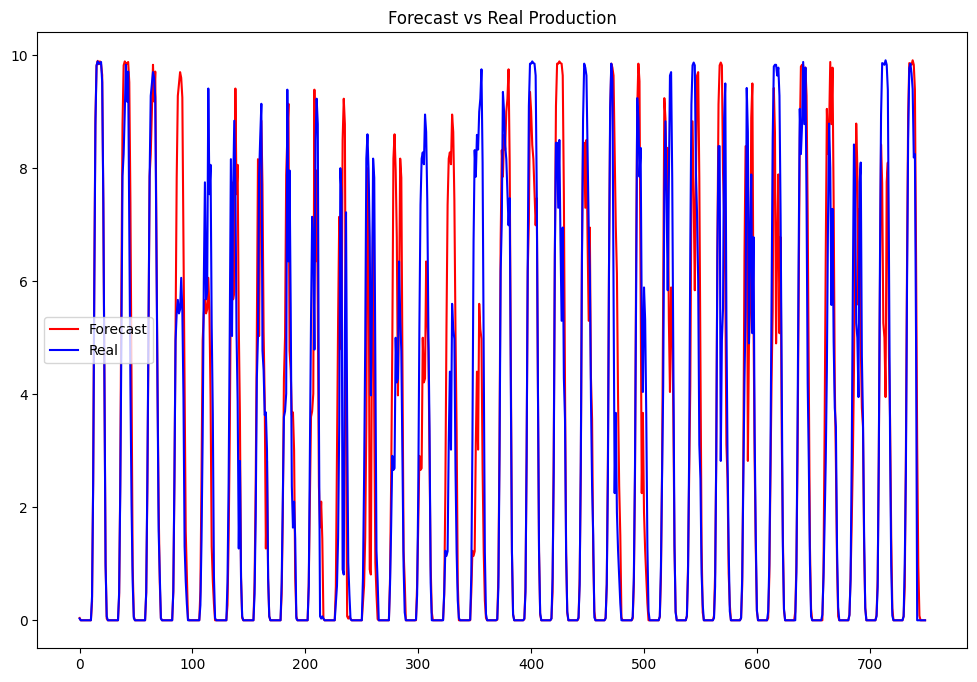

In [25]:
# Test Period
plt.figure(figsize=(12, 8))
plt.plot(range(len(df_test["production"].iloc[-750:])), arima_test_pred[-750:], label="Forecast", c="red")
plt.plot(range(len(df_test["production"].iloc[-750:])), df_test["production"].iloc[-750:], label="Real", c="blue")
plt.title("Forecast vs Real Production")
plt.legend(loc="best")
plt.show()

Real and forecasted values of test data are plotted. Forecasted and real values are represented by red and blue lines, respectively. It seems there are more gaps at some time points between these two than train set results. However, it predicts some time points better. It will be more clear after checking error metrices.

In [26]:
accu(df_test["production"], arima_test_pred) # Calculate the error metrics

,n,mean,sd,CV,FBias,MAPE,RMSE,MAD,MADP,WMAPE
0,2688,2.600301,3.496188,1.344532,0.002229,0.198583,1.919275,0.947456,0.364364,0.364364


Train data predictions have higher error metric values than test data. The model's underprediction rate is lower in this case, but error values are more than desired. Therefore, the ARIMA model will not be used in the forecasting procedure and new models will be tried to be built. Also, one other reason why ARIMA is not used directly is the lack of weather regressors. 

In [27]:
# Save the results
forecasted_train = {"Arima": forecasted_values}
forecasted_test = {"Arima": arima_test_pred}

### 3b. Model II - Penalized Regression Model <a name="3b2"></a>
As it's shown previously, there are a lot of variables which affect production amount at different rates. After plotting their relations with the production data, clear patterns could not be found. Therefore, letting the machine decide which variables to include the model seems a logical way. In this part, to achieve this, a penalized regression model will be built and how it works will be observed.

In [28]:
# Lasso Regression
features_train = df_train.copy()
features_train.drop(columns=["date", "hour", "production"], inplace=True)

lst = weather_df.columns[4:-10]

# Include the following features
# Max, Min, Mean, Sum, Median, Std, Var
for feature in lst:
    feature_col = df_train.columns[df_train.columns.str.contains(feature)]
    features_train[f"max_{feature}"] = df_train[feature_col].max(axis=1)
    features_train[f"min_{feature}"] = df_train[feature_col].min(axis=1)
    features_train[f"mean_{feature}"] = df_train[feature_col].mean(axis=1)
    features_train[f"sum_{feature}"] = df_train[feature_col].sum(axis=1)
    features_train[f"median_{feature}"] = df_train[feature_col].median(axis=1)
    features_train[f"std_{feature}"] = df_train[feature_col].std(axis=1)
    features_train[f"var_{feature}"] = df_train[feature_col].var(axis=1)

features_train

,dswrf_surface_37.75_34.5,dswrf_surface_37.75_34.75,dswrf_surface_37.75_35.0,dswrf_surface_37.75_35.25,dswrf_surface_37.75_35.5,dswrf_surface_38.0_34.5,dswrf_surface_38.0_34.75,dswrf_surface_38.0_35.0,dswrf_surface_38.0_35.25,dswrf_surface_38.0_35.5,...,median_uswrf_surface,std_uswrf_surface,var_uswrf_surface,max_tmp_surface,min_tmp_surface,mean_tmp_surface,sum_tmp_surface,median_tmp_surface,std_tmp_surface,var_tmp_surface
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,2.970018,1.938558,2.477303,61.932586,2.524168,0.283675,0.080472
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,2.957112,1.909188,2.461961,61.549024,2.512177,0.287704,0.082774
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,2.960597,1.883783,2.452826,61.320651,2.487963,0.290394,0.084329
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,2.945884,1.881728,2.448251,61.206282,2.472008,0.287081,0.082416
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,2.942915,1.863665,2.448233,61.205814,2.486316,0.291087,0.084732
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18255,1.576039,1.070560,1.187324,0.862606,1.083381,1.712690,1.449336,1.104238,1.268847,1.554716,...,0.884301,0.240753,0.057962,2.939731,2.208857,2.645475,66.136863,2.677194,0.193474,0.037432
18256,1.260746,0.856532,0.950066,0.690044,0.866578,1.370194,1.159552,0.883349,1.015078,1.243814,...,0.707501,0.192597,0.037094,2.896690,1.827368,2.540076,63.501900,2.607883,0.257617,0.066367
18257,1.050692,0.713777,0.791618,0.575071,0.722254,1.141723,0.966154,0.736089,0.845761,1.036477,...,0.589434,0.160505,0.025762,2.884341,1.856992,2.493482,62.337046,2.543567,0.255527,0.065294
18258,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,2.884701,1.860687,2.484138,62.103449,2.462910,0.234975,0.055213


Maximum, minimum, mean, sum, median, standard deviation and variance of variables can be found above.

In [29]:
# Find the optimal lambda
lasso_cv = LassoCV(cv=5) # 5 fold cross validation
lasso_cv.fit(features_train, df_train["production"]) # Finds the best alpha

optimal_lambda = lasso_cv.alpha_
optimal_lambda

0.16421425589191282

Optimal lambda value is calculated with cross validation in the train data and found as 0.16756. Note that this value can change in different runs.

In [30]:
# Train the Lasso model
lasso = Lasso(optimal_lambda)

lasso.fit(features_train, df_train["production"])

Lasso(alpha=0.16421425589191282)

Lasso model is built with this alpha value.

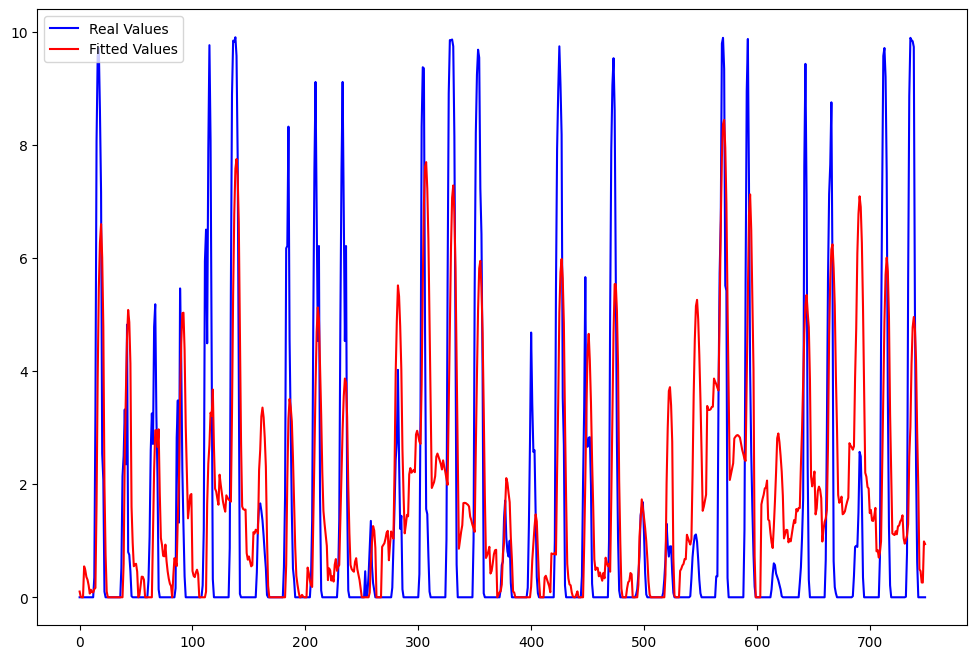

In [31]:
# Plot the results
lasso_result = lasso.predict(features_train)
fitted = [max(0, i) for i in lasso_result]

plt.figure(figsize=(12, 8))
plt.plot(range(len(fitted[-750:])), df_train["production"][-750:], label="Real Values", color="blue")
plt.plot(range(len(fitted[-750:])), fitted[-750:], label="Fitted Values", color="red")
plt.legend(loc="best")
plt.show()

Forecasted and real values are plotted together for visualization and as the previous model, red line represents predcited values while blue one represents real ones. There are huge gaps between these two plots. At points where production amount is higher the model underpredicts the values, and while the production is low (zero) the model overpredicts it. It will work worse than ARIMA model but let's see test data and error metrices.

In [32]:
accu(df_train["production"], fitted) # Calculate the error metrics

,n,mean,sd,CV,FBias,MAPE,RMSE,MAD,MADP,WMAPE
0,18260,2.565885,3.688927,1.437682,-0.035382,0.703112,2.137464,1.499716,0.584483,0.584483


Error metric values are higher than ARIMA model and they are far beyond desired level. Lasso regression model overpredicts the production amount as opposed to ARIMA model.

In [33]:
# Features for the test data
features_test = df_test.copy()
features_test.drop(columns=["date", "hour", "production"], inplace=True)

lst = weather_df.columns[4:-10]

for feature in lst:
    feature_col = df_test.columns[df_test.columns.str.contains(feature)]
    features_test[f"max_{feature}"] = df_test[feature_col].max(axis=1)
    features_test[f"min_{feature}"] = df_test[feature_col].min(axis=1)
    features_test[f"mean_{feature}"] = df_test[feature_col].mean(axis=1)
    features_test[f"sum_{feature}"] = df_test[feature_col].sum(axis=1)
    features_test[f"median_{feature}"] = df_test[feature_col].median(axis=1)
    features_test[f"std_{feature}"] = df_test[feature_col].std(axis=1)
    features_test[f"var_{feature}"] = df_test[feature_col].var(axis=1)

features_test

,dswrf_surface_37.75_34.5,dswrf_surface_37.75_34.75,dswrf_surface_37.75_35.0,dswrf_surface_37.75_35.25,dswrf_surface_37.75_35.5,dswrf_surface_38.0_34.5,dswrf_surface_38.0_34.75,dswrf_surface_38.0_35.0,dswrf_surface_38.0_35.25,dswrf_surface_38.0_35.5,...,median_uswrf_surface,std_uswrf_surface,var_uswrf_surface,max_tmp_surface,min_tmp_surface,mean_tmp_surface,sum_tmp_surface,median_tmp_surface,std_tmp_surface,var_tmp_surface
18260,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,2.881344,1.744429,2.433000,60.824993,2.427178,0.276363,0.076376
18261,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,2.873671,1.633083,2.419346,60.483651,2.422292,0.296542,0.087937
18262,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,2.868395,1.641504,2.418919,60.472971,2.420684,0.301063,0.090639
18263,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,2.852330,1.626206,2.406809,60.170233,2.412892,0.308227,0.095004
18264,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,2.830510,1.586611,2.335391,58.384774,2.339555,0.291150,0.084768
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20943,4.417397,4.350159,4.862816,4.725335,3.333375,4.279121,4.806142,5.068056,4.450029,4.830602,...,1.570803,0.334526,0.111908,5.692908,4.556321,5.291818,132.295448,5.294248,0.263889,0.069638
20944,3.590903,3.537817,3.940923,3.818174,2.711204,3.444363,3.881845,4.094146,3.609129,3.911386,...,1.275921,0.273807,0.074970,5.255237,4.522519,4.937514,123.437858,4.915365,0.174438,0.030428
20945,2.992419,2.948180,3.283965,3.181867,2.259280,2.870162,3.234871,3.411761,3.007663,3.259600,...,1.063162,0.228177,0.052065,5.220505,4.312462,4.840934,121.023357,4.799483,0.245668,0.060353
20946,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,5.189401,4.364761,4.795418,119.885444,4.834985,0.239255,0.057243


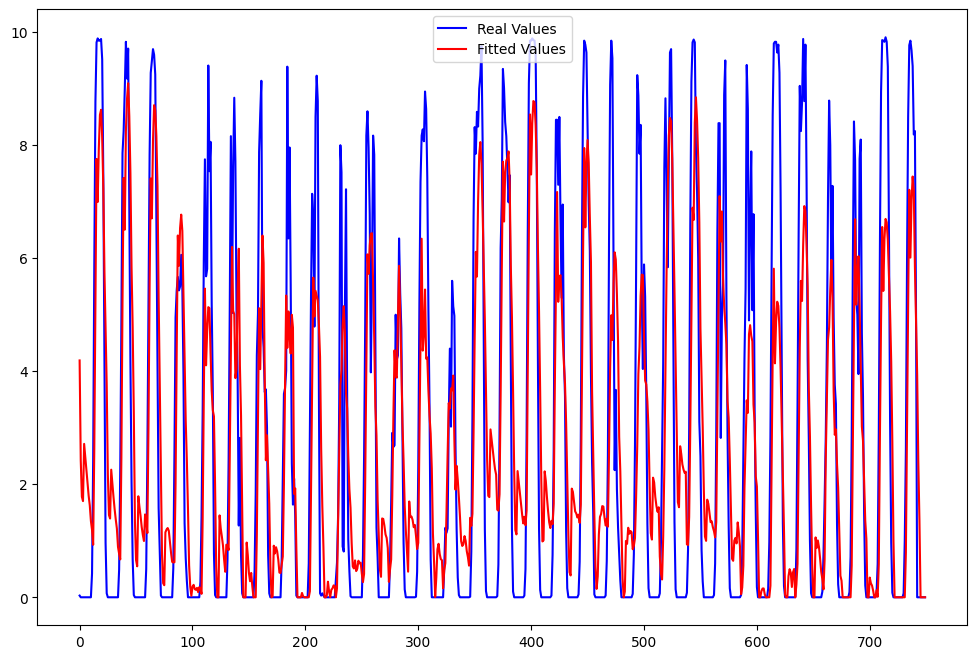

In [34]:
# Plot the results
predictions = lasso.predict(features_test)
predictions_test = [max(0, i) for i in predictions]

plt.figure(figsize=(12, 8))
plt.plot(range(len(predictions_test[-750:])), df_test["production"].iloc[-750:], label="Real Values", color="blue")
plt.plot(range(len(predictions_test[-750:])), predictions_test[-750:], label="Fitted Values", color="red")
plt.legend(loc="best")
plt.show()

Overprediction and underprediction cases are observed in test data. Also, it seems the model overpredicts more at this case compared to test data. Let's see error metrices.

In [35]:
accu(df_test["production"], predictions_test) # Calculate the error metrics

,n,mean,sd,CV,FBias,MAPE,RMSE,MAD,MADP,WMAPE
0,2688,2.600301,3.496188,1.344532,-0.127096,0.933208,2.224446,1.784562,0.68629,0.68629


As it is observed, the model overpredicts more at this case (FBias is more negative). Error metric values are much worse in this data set. The model have 75% error while predicting. It cannot be used in this case. Search for better models countinues.

In [36]:
forecasted_train["Lasso"] = fitted
forecasted_test["Lasso"] = predictions_test

### 3b. Model III - ARIMA & Lasso Regression Model <a name="3b3"></a>
The previous two models lacked the same parts of the given data oppositely. The Lasso model lacked the relations between production data itself whereas the ARIMA model lacked weather regressors. So, combining these two in a linear model setting can work well. In this part, ARIMA and Lasso models are combined to build a new model.

In [37]:
# Combine the results
df_combined = pd.DataFrame(data = [fitted, forecasted_values])
df_combined = df_combined.T
df_combined.columns = ['Lasso', 'Arima']
df_combined = sm.add_constant(df_combined)

df_combined

,const,Lasso,Arima
0,1.0,0.000000,0.000000
1,1.0,0.000000,0.000000
2,1.0,0.000000,0.000000
3,1.0,0.000000,0.000000
4,1.0,0.000000,3.400000
...,...,...,...
18255,1.0,0.462583,0.019966
18256,1.0,0.261788,0.000000
18257,1.0,0.260214,0.008114
18258,1.0,0.987310,0.000000


For combination, a linear regression model will be built. 

In [38]:
# Fit them through linear regression
lm = sm.OLS(df_train["production"], df_combined)
result = lm.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:             production   R-squared:                       0.863
Model:                            OLS   Adj. R-squared:                  0.863
Method:                 Least Squares   F-statistic:                 5.747e+04
Date:                Wed, 05 Jun 2024   Prob (F-statistic):               0.00
Time:                        12:59:51   Log-Likelihood:                -31601.
No. Observations:               18260   AIC:                         6.321e+04
Df Residuals:                   18257   BIC:                         6.323e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1228      0.014     -8.902      0.0

The regression model has 0.863 R-squared value, and it is a good value. Let's see how it works while predicting the production values.

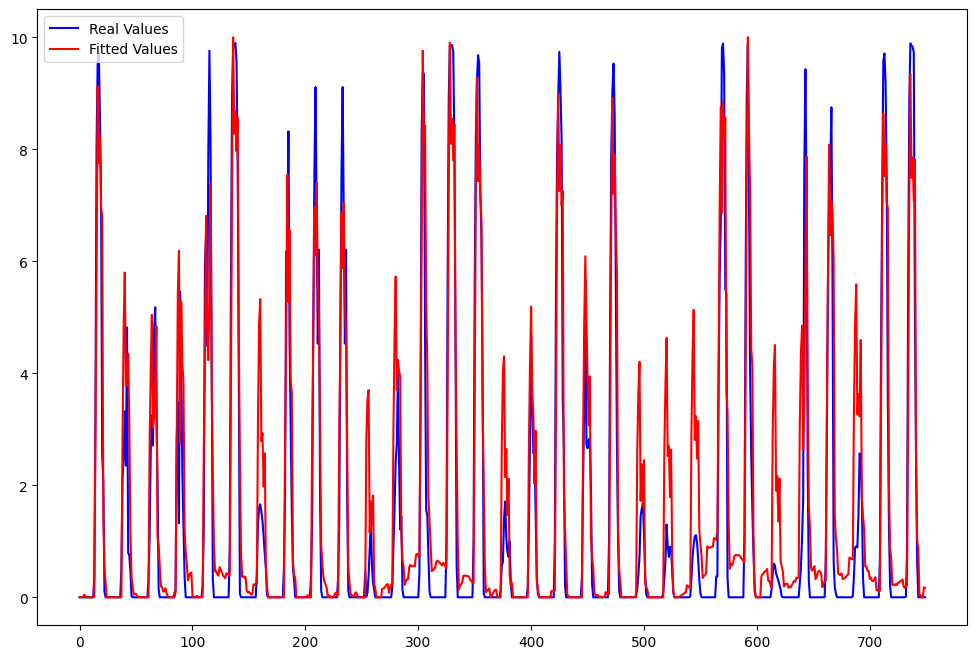

In [39]:
# Plot the results
fitted = [max(0, i) for i in result.fittedvalues]
fitted = [min(10, i) for i in fitted]

plt.figure(figsize=(12, 8))
plt.plot(range(len(fitted[-750:])), df_train["production"][-750:], label="Real Values", color="blue")
plt.plot(range(len(fitted[-750:])), fitted[-750:], label="Fitted Values", color="red")
plt.legend(loc="best")
plt.show()

Real and predicted production amounts are plotted together and represented by blue and red lines respectively. This model works much better than Lasso regression model while predicting lower production values. Also, it seems the gap while predicting higher production values are smaller than both ARIMA and lasso regression models. Error metrices will give more clear result.

In [40]:
accu(df_train["production"], fitted) # Calculate the error metrics

,n,mean,sd,CV,FBias,MAPE,RMSE,MAD,MADP,WMAPE
0,18260,2.565885,3.688927,1.437682,-0.000509,0.297014,1.351876,0.793577,0.30928,0.30928


This model has lower RMSE, MAD, MADP, and WMAPE than the previous models. However, its MAPE value is larger than ARIMA model. It underpredicts the production amounts, but absolute FBias value is smaller than previous models. Let's see how it works on test data.

In [41]:
# Test the model
df_combined_test = pd.DataFrame(data = [forecasted_test["Arima"], forecasted_test["Lasso"]])
df_combined_test = df_combined_test.T
df_combined_test.columns = ['Lasso', 'Arima']
df_combined_test = sm.add_constant(df_combined_test)

df_combined_test

,const,Lasso,Arima
0,1.0,-0.000512,0.850802
1,1.0,-0.000009,0.855853
2,1.0,-0.000236,0.928610
3,1.0,-0.000008,0.940223
4,1.0,-0.000109,0.998466
...,...,...,...
2683,1.0,0.000000,0.000000
2684,1.0,0.000000,0.000000
2685,1.0,0.000000,0.000000
2686,1.0,0.000000,0.000000


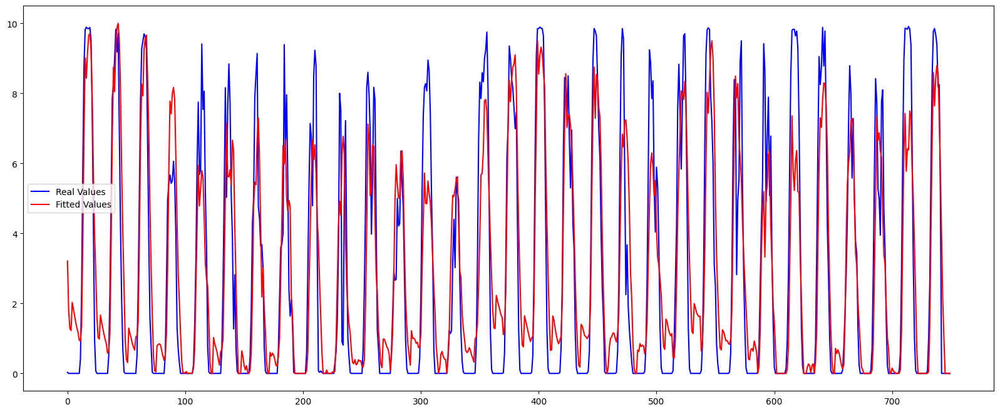

In [42]:
# Plot the results
lm_test = result.predict(df_combined_test)
fitted_test = [max(0, i) for i in lm_test]
fitted_test = [min(10, i) for i in fitted_test] 

plt.figure(figsize=(20, 8))
plt.plot(range(len(fitted_test[-750:])), df_test["production"].iloc[-750:], label="Real Values", color="blue")
plt.plot(range(len(fitted_test[-750:])), fitted_test[-750:], label="Fitted Values", color="red")
plt.legend(loc="best")
plt.show()

Real and predicted production amounts are plotted together and represented by blue and red lines respectively. The combined model does not seem to work well in test data. It overpredicts points where production is low, and the gap while predicting higher production values are high. Error metrices will be high but let's see.

In [43]:
accu(df_test["production"], fitted_test) # Calculate the error metrics

,n,mean,sd,CV,FBias,MAPE,RMSE,MAD,MADP,WMAPE
0,2688,2.600301,3.496188,1.344532,-0.150969,0.703175,1.803095,1.398366,0.537771,0.537771


The model overpredicts the production values. Its error metric values are very high and overall, its error metrices have higher values than the ARIMA model and lower values than the Lasso Regression model.

Note that this model works worse, especially in the parts where there is no production therefore in a prediction setting these parts should be given as 0 directly to improve the results.

In [44]:
# Save the results
forecasted_train["Arima+Lasso"] = fitted
forecasted_test["Arima+Lasso"] = fitted_test

Let's plot and check the residuals to see overall performance.

<Axes: title={'center': 'Residuals'}, ylabel='Density'>

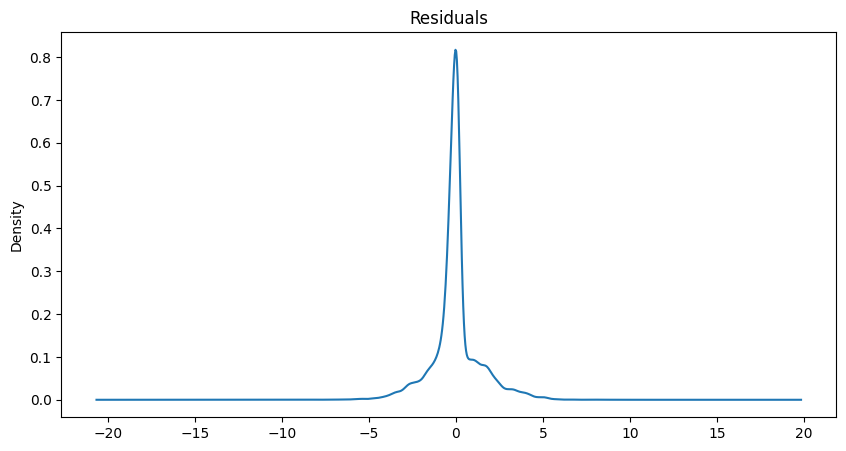

In [45]:
# Check the residuals
result.resid.plot(kind="kde", title="Residuals", figsize=(10, 5))

Residuals seem to have zero mean but the shape seems narrower than the normal distribution.

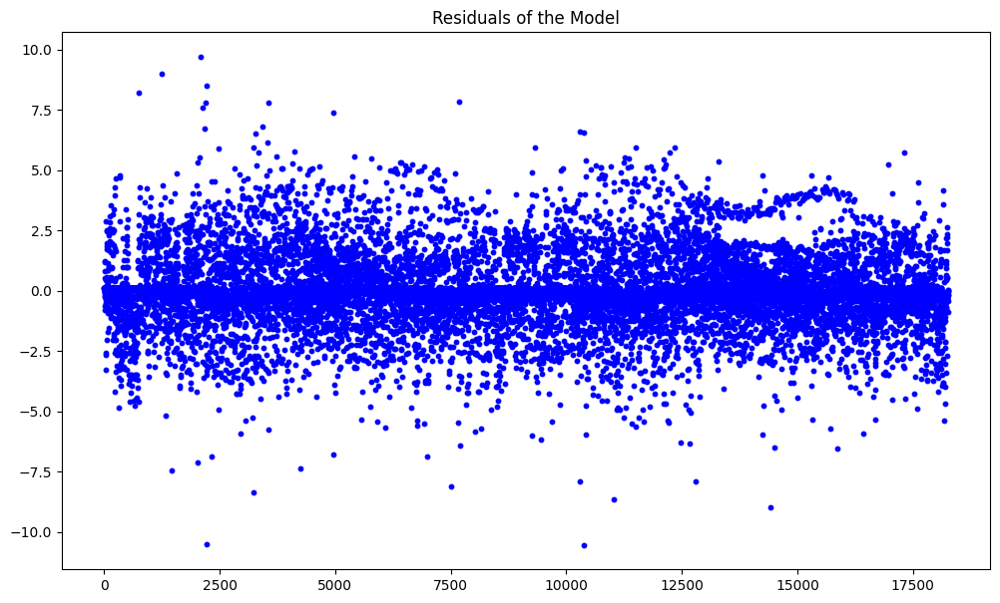

In [46]:
residual = result.resid

plt.figure(figsize = (12, 7))
plt.scatter(range(len(df_combined)),residual, label = "Residual", color = "blue", s = 10)
plt.title("Residuals of the Model")

plt.show()

Residuals of the model seems to have mean zero, but variance value seems high. Also, there are some outliers. Let's check aoutocorrelation for further information.

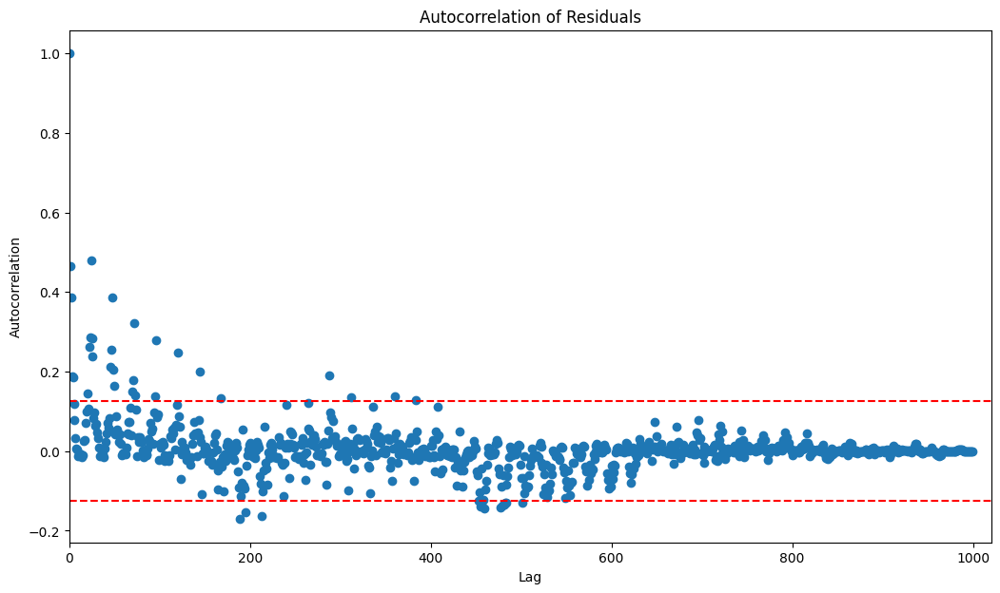

In [47]:
plt.figure(figsize=(12.5, 7))  
plt.acorr(result.resid[:1000], maxlags=len(result.resid[:1000])-1, usevlines = False, marker='o')
plt.axhline(y=0.125, color='red', linestyle='--') 
plt.axhline(y=-0.125, color='red', linestyle='--') 
plt.title("Autocorrelation of Residuals")
plt.xlim(0, 1020)
plt.xlabel("Lag")
plt.ylabel("Autocorrelation")
plt.show()

### 3b. Model IV - Combined Model & Monthly Dummy Variables <a name="3b4"></a>

The combined model worked good in the train set, but error rates were high when it's applied to test set. Thus, improving the model with additional variables might result in our best model. The production amount has seasonality within the day, but the month which the production is done may also have an affect. The weather conditions are somewhat similar in every year, so adding monthly dummy variables might improve the model. Let's try this.

In [48]:
# To improve the residuals' normality assumption
a = df_combined.copy()

df_combined["month"] = df_train["date"].dt.month
month_encoding = pd.get_dummies(df_combined["month"], prefix="month", dtype="int64")
df_combined = pd.concat([df_combined, month_encoding], axis=1)
df_combined.drop(columns=["month", "month_12"], inplace=True)

df_combined

,const,Lasso,Arima,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11
0,1.0,0.000000,0.000000,1,0,0,0,0,0,0,0,0,0,0
1,1.0,0.000000,0.000000,1,0,0,0,0,0,0,0,0,0,0
2,1.0,0.000000,0.000000,1,0,0,0,0,0,0,0,0,0,0
3,1.0,0.000000,0.000000,1,0,0,0,0,0,0,0,0,0,0
4,1.0,0.000000,3.400000,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18255,1.0,0.462583,0.019966,1,0,0,0,0,0,0,0,0,0,0
18256,1.0,0.261788,0.000000,1,0,0,0,0,0,0,0,0,0,0
18257,1.0,0.260214,0.008114,1,0,0,0,0,0,0,0,0,0,0
18258,1.0,0.987310,0.000000,1,0,0,0,0,0,0,0,0,0,0


In [49]:
# Fit the model
lm_motnh = sm.OLS(df_train["production"], df_combined)
result_month = lm_motnh.fit()
print(result_month.summary())

                            OLS Regression Results                            
Dep. Variable:             production   R-squared:                       0.865
Model:                            OLS   Adj. R-squared:                  0.865
Method:                 Least Squares   F-statistic:                     8966.
Date:                Wed, 05 Jun 2024   Prob (F-statistic):               0.00
Time:                        12:59:52   Log-Likelihood:                -31487.
No. Observations:               18260   AIC:                         6.300e+04
Df Residuals:                   18246   BIC:                         6.311e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1820      0.036     -5.096      0.0

The adjusted R-squared value is 0.865, and it's slightly higher than the combined model. AIC and BIC values are very low which means there's no overfitting. However, some month dummy variables have high probability values such as month_3, 4, 9, 10, 11 have 0.462, 0.107, 0.257, 0.817 and 0.185, respectively. Because of probabilities, null hypothesis cannot be rejected. And we cannot say they have influence on the production. Let's see how it predicts the production amounts.

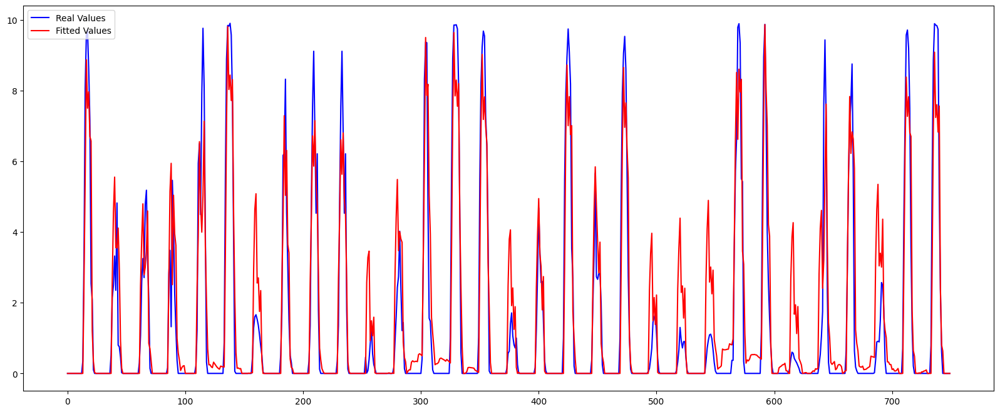

In [50]:
# Plot the results
fitted = [max(0, i) for i in result_month.fittedvalues]
fitted = [min(10, i) for i in fitted]

plt.figure(figsize=(20, 8))
plt.plot(range(len(fitted[-750:])), df_train["production"][-750:], label="Real Values", color="blue")
plt.plot(range(len(fitted[-750:])), fitted[-750:], label="Fitted Values", color="red")
plt.legend(loc="best")
plt.show()

Red and blue lines represent fitted and real values, respectively. The model seems to have a problem predicting the production amount where it's highest. It seems overpredicting and underpredicting at some cases. It works better at predicting lowest production amounts but there're some points where it overpredicts. Let's see error metrices to have more clear information.

In [51]:
accu(df_train["production"], fitted) # Calculate the error metrics

,n,mean,sd,CV,FBias,MAPE,RMSE,MAD,MADP,WMAPE
0,18260,2.565885,3.688927,1.437682,-0.002383,0.298079,1.340546,0.789914,0.307853,0.307853


FBias value is negative so the model overpredicts the production amounts. MAD, MADP, and WMAPE values are slightly less than the combined model. However, it's MAPE is slightly more than that. Lest's see how it works in test data set.

In [52]:
# Test the model
b = df_combined_test.copy()

df_combined_test["month"] = df_test["date"].dt.month.tolist()
month_encoding_test = pd.get_dummies(df_combined_test["month"], prefix="month", dtype="int64")
df_combined_test = pd.concat([df_combined_test, month_encoding_test], axis=1)
df_combined_test.drop(columns=["month"], inplace=True)
for i in range(6,12):
    df_combined_test[f"month_{i}"] = 0

df_combined_test["month_1"] = 0

df_combined_test

,const,Lasso,Arima,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_1
0,1.0,-0.000512,0.850802,1,0,0,0,0,0,0,0,0,0,0
1,1.0,-0.000009,0.855853,1,0,0,0,0,0,0,0,0,0,0
2,1.0,-0.000236,0.928610,1,0,0,0,0,0,0,0,0,0,0
3,1.0,-0.000008,0.940223,1,0,0,0,0,0,0,0,0,0,0
4,1.0,-0.000109,0.998466,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2683,1.0,0.000000,0.000000,0,0,0,1,0,0,0,0,0,0,0
2684,1.0,0.000000,0.000000,0,0,0,1,0,0,0,0,0,0,0
2685,1.0,0.000000,0.000000,0,0,0,1,0,0,0,0,0,0,0
2686,1.0,0.000000,0.000000,0,0,0,1,0,0,0,0,0,0,0


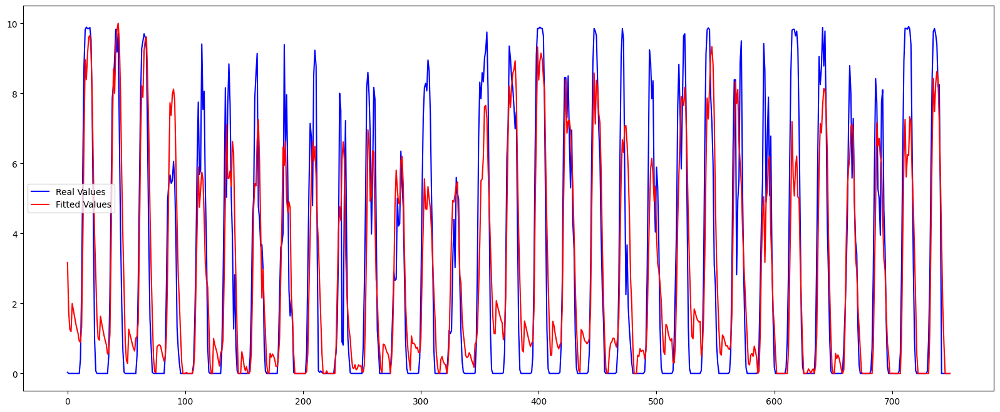

In [53]:
# Plot the results
lm_test = result_month.predict(df_combined_test)
fitted_test = [max(0, i) for i in lm_test]
fitted_test = [min(10, i) for i in fitted_test]

plt.figure(figsize=(20, 8))
plt.plot(range(len(fitted_test[-750:])), df_test["production"].iloc[-750:], label="Real Values", color="blue")
plt.plot(range(len(fitted_test[-750:])), fitted_test[-750:], label="Fitted Values", color="red")
plt.legend(loc="best")
plt.show()

The red and blue lines represent fitted and real values, respectively. The model seems to underpredict highest production amounts and gap values seem high. Nearly in all the time points plotted above, the model overpredicts lowest production amounts. It does not seem to work well, but let's see error metrices.

In [54]:
accu(df_test["production"], fitted_test) # Calculate the error metrics

,n,mean,sd,CV,FBias,MAPE,RMSE,MAD,MADP,WMAPE
0,2688,2.600301,3.496188,1.344532,-0.134415,0.685622,1.810888,1.387751,0.533689,0.533689


As it can be seen from above, the model overpredicts the production amount (FBias is negative). Its error values are higher than desired, but they're slightly less than the combined model. Thus, there's a little improvement. 

In [55]:
forecasted_train["Arima+Lasso+Month"] = fitted
forecasted_test["Arima+Lasso+Month"] = fitted_test

<Axes: title={'center': 'Residuals'}, ylabel='Density'>

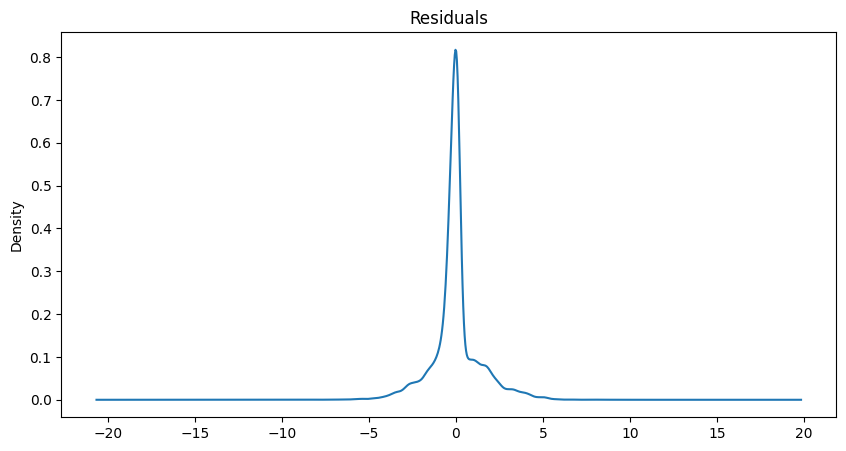

In [56]:
# Check the residuals
result.resid.plot(kind="kde", title="Residuals", figsize=(10, 5))

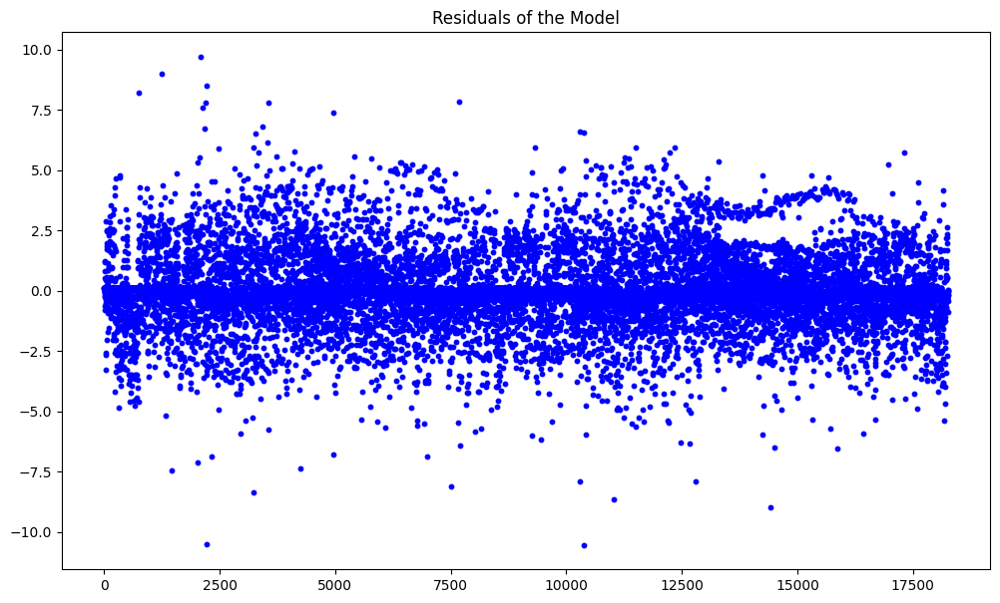

In [57]:
residual = result.resid

plt.figure(figsize = (12, 7))
plt.scatter(range(len(df_combined)),residual, label = "Residual", color = "blue", s = 10)
plt.title("Residuals of the Model")

plt.show()

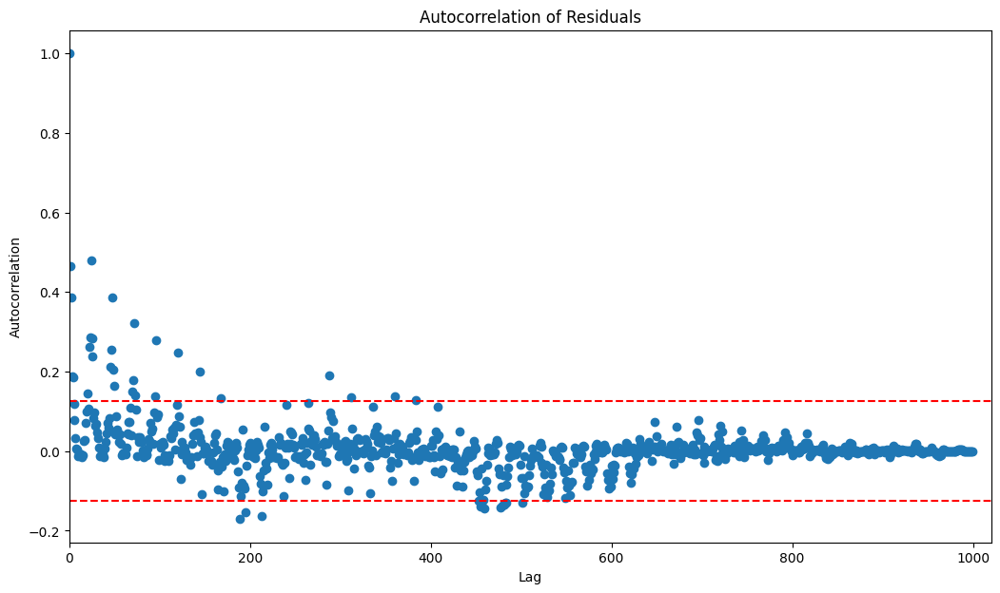

In [58]:
plt.figure(figsize=(12.5, 7))  
plt.acorr(result.resid[:1000], maxlags=len(result.resid[:1000])-1, usevlines = False, marker='o')
plt.axhline(y=0.125, color='red', linestyle='--') 
plt.axhline(y=-0.125, color='red', linestyle='--') 
plt.title("Autocorrelation of Residuals")
plt.xlim(0, 1020)
plt.xlabel("Lag")
plt.ylabel("Autocorrelation")
plt.show()

In general, residuals seem to have similiar patterns in all of the plots above.

### 3b. Additional Model- Hourly Model <a name="3b5"></a>

The main approach of the project is the previous model, but they do not work that well. Thus, an additional model example will be given here to show another possible way to approach this forecasting problem. It seemed that the error rates changed from hour to hour, so trying to build a model for each hour might make sense. It's a long code, so only hour 6 is here for analysis but all of it can be found in a separate code file given at the end of the report.

In [59]:
mask = df["hour"] == 6 # Get the data for 6 am
df_hour = df[mask]
df_hour.reset_index(drop=True, inplace=True)
df_hour_train = df_hour[df_hour["date"] < train_test_split_date] 
df_hour_test = df_hour[df_hour["date"] >= train_test_split_date] 
df_hour_train.reset_index(drop=True, inplace=True)
df_hour_test.reset_index(drop=True, inplace=True)

df_hour

,date,hour,dswrf_surface_37.75_34.5,dswrf_surface_37.75_34.75,dswrf_surface_37.75_35.0,dswrf_surface_37.75_35.25,dswrf_surface_37.75_35.5,dswrf_surface_38.0_34.5,dswrf_surface_38.0_34.75,dswrf_surface_38.0_35.0,...,tmp_surface_38.5_34.75,tmp_surface_38.5_35.0,tmp_surface_38.5_35.25,tmp_surface_38.5_35.5,tmp_surface_38.75_34.5,tmp_surface_38.75_34.75,tmp_surface_38.75_35.0,tmp_surface_38.75_35.25,tmp_surface_38.75_35.5,production
0,2022-01-01,6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.796341,2.567324,2.522566,2.359434,2.846216,2.705534,2.432177,2.281041,2.198397,0.00
1,2022-01-02,6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.267960,3.036939,2.899968,3.503786,3.595176,3.412035,3.124256,2.973101,2.701385,0.00
2,2022-01-03,6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.685982,2.444194,2.271147,1.677709,2.806652,2.713992,2.389464,2.314727,2.063727,0.00
3,2022-01-04,6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.000705,2.770820,2.665036,2.517651,3.030488,2.939584,2.695832,2.535183,2.059412,0.00
4,2022-01-05,6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.874656,2.539388,2.493577,2.127801,2.904842,2.776704,2.482527,2.329574,2.183884,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
868,2024-05-19,6,0.026045,0.028509,0.031648,0.033406,0.035293,0.027719,0.029898,0.032447,...,4.600513,4.443268,4.304340,4.708892,4.580921,4.429676,4.266114,4.186047,4.050966,3.38
869,2024-05-20,6,0.026680,0.028928,0.028132,0.028487,0.034453,0.028139,0.030316,0.032239,...,4.658352,4.527340,4.460274,5.033127,4.693019,4.675568,4.542454,4.390034,4.473935,1.71
870,2024-05-21,6,0.028374,0.031025,0.034130,0.035865,0.037814,0.030239,0.032407,0.035775,...,4.480847,4.324110,4.345556,4.721682,4.724790,4.453842,4.214341,4.048807,3.920218,2.85
871,2024-05-22,6,0.031127,0.033750,0.037233,0.039144,0.040755,0.032759,0.035543,0.038479,...,4.496669,4.366344,4.265734,4.762483,4.583198,4.444055,4.294460,4.150988,4.040375,2.92


In [60]:
# Prepare the data for the model

# Monthly dummy variables
df_hour_month_train = df_hour_train["date"].dt.month
df_hour_month_train = pd.get_dummies(df_hour_month_train, prefix="month", dtype="int64")
df_hour_month_train.drop(columns=["month_12"], inplace=True)
df_hour_month_train

df_model_hour = df_hour_month_train.copy()
df_model_hour["trend"] = np.arange(len(df_model_hour)) # Trend variable
df_model_hour = sm.add_constant(df_model_hour) # Add the constant

# Features for the model
features_train = df_hour_train.copy()
features_train.drop(columns=["date", "hour", "production"], inplace=True)
lst = weather_df.columns[4:-10]
for feature in lst:
    feature_col = df_hour_train.columns[df_hour_train.columns.str.contains(feature)]
    features_train[f"mean_{feature}"] = df_hour_train[feature_col].mean(axis=1)
features_train = features_train.filter(regex=r'^mean_')
features_train

df_model_hour= pd.concat([df_model_hour, features_train], axis=1) # Combine the data

df_model_hour

,const,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,...,mean_dswrf_surface,mean_tcdc_low.cloud.layer,mean_tcdc_middle.cloud.layer,mean_tcdc_high.cloud.layer,mean_tcdc_entire.atmosphere,mean_uswrf_top_of_atmosphere,mean_csnow_surface,mean_dlwrf_surface,mean_uswrf_surface,mean_tmp_surface
0,1.0,1,0,0,0,0,0,0,0,0,...,0.0,0.2964,0.5372,1.1688,2.1772,0.0,0.0,2.534127,0.0,2.452826
1,1.0,1,0,0,0,0,0,0,0,0,...,0.0,9.3304,8.9960,9.9588,10.0000,0.0,6.8,5.801885,0.0,3.067450
2,1.0,1,0,0,0,0,0,0,0,0,...,0.0,0.9296,0.0000,0.0284,1.0084,0.0,0.0,1.400544,0.0,2.066741
3,1.0,1,0,0,0,0,0,0,0,0,...,0.0,0.0000,7.4092,9.3828,9.5536,0.0,0.0,3.605417,0.0,2.588966
4,1.0,1,0,0,0,0,0,0,0,0,...,0.0,0.0000,0.0088,1.0592,1.3740,0.0,0.0,2.388424,0.0,2.411131
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
756,1.0,1,0,0,0,0,0,0,0,0,...,0.0,6.8540,5.4612,1.7792,8.7156,0.0,6.0,2.982100,0.0,2.376728
757,1.0,1,0,0,0,0,0,0,0,0,...,0.0,6.4448,10.0000,2.2528,10.0000,0.0,2.0,3.453101,0.0,2.393940
758,1.0,1,0,0,0,0,0,0,0,0,...,0.0,5.7448,4.1112,0.0000,7.8704,0.0,0.8,1.968997,0.0,2.145257
759,1.0,1,0,0,0,0,0,0,0,0,...,0.0,3.1328,9.7120,2.6400,9.7720,0.0,1.2,3.111251,0.0,2.362636


The weather variables described in the beginning affect production amounts, but there're a lot of them due to their location. Therefore, mean of every parameter is taken. Also, month parameters improved the previous model a bit, so they can be added too. Let's see how their Regression model works.

In [61]:
# Fit the model
lm = sm.OLS(df_hour_train["production"], df_model_hour)
result = lm.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:             production   R-squared:                       0.514
Model:                            OLS   Adj. R-squared:                  0.499
Method:                 Least Squares   F-statistic:                     35.42
Date:                Wed, 05 Jun 2024   Prob (F-statistic):          6.23e-100
Time:                        12:59:53   Log-Likelihood:                -779.69
No. Observations:                 761   AIC:                             1605.
Df Residuals:                     738   BIC:                             1712.
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

The model's adjusted R-squared value is 0.510 (not a good value) and its BIC and AIC values are high. Also, some independent variables have high probability values such as mean_tcdc_high.cloud.layer, mean_tcdc_middle.cloud.layer, and mean_uswrf_surface. Because they seem not to have effect on the model, they can be dropped. Also, because data has seasonality, adding lagged values may improve it. These operations will be done and moving average term will be added for smoothşng. Let's see how it works.

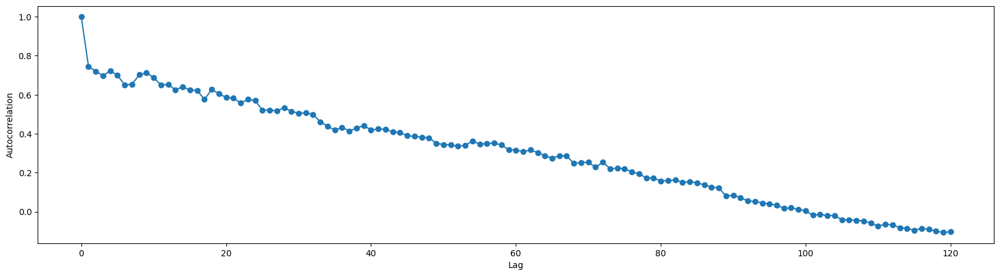

In [62]:
production_hour = df_hour_train["production"]

acf_values = acf(production_hour, nlags=24*5)
plt.figure(figsize=(20, 5))
plt.plot(range(len(acf_values)), acf_values, marker='o', linestyle='-')
plt.xlabel("Lag")
plt.ylabel("Autocorrelation")
plt.show()

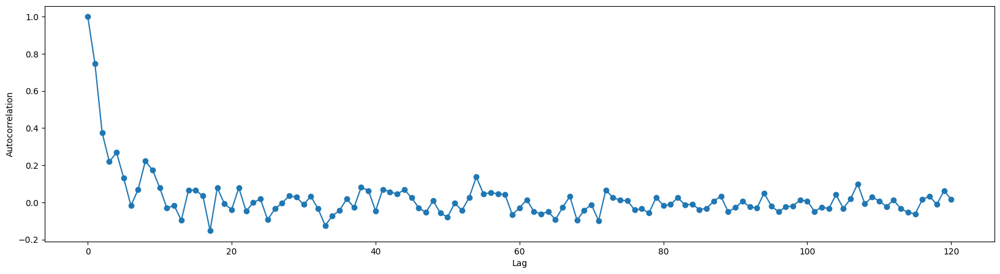

In [63]:
production_hour = df_hour_train["production"]

acf_values = pacf(production_hour, nlags=24*5)
plt.figure(figsize=(20, 5))
plt.plot(range(len(acf_values)), acf_values, marker='o', linestyle='-')
plt.xlabel("Lag")
plt.ylabel("Autocorrelation")
plt.show()

Data has a lot of autocorrelation and partial autocorrelation. It seems that the model can be improved by adding lagged values and moving average term. Let's see how it works.

In [64]:
# Drop unnecessary columns
drop_lst_hour_6 = ["mean_dswrf_surface", "mean_tcdc_middle.cloud.layer", "mean_tcdc_high.cloud.layer", "mean_uswrf_surface"]

df_model_hour.drop(columns = drop_lst_hour_6, inplace = True)

df_model_hour["lag_2"] = df_hour_train["production"].shift(2, fill_value=0) # Lag 2
df_model_hour["ma_3"] = df_hour_train["production"].rolling(window=3).mean() # Moving Average 3
df_model_hour.bfill(inplace=True) # Fill the missing values if there are any

In [65]:
# Fit the model
lm = sm.OLS(df_hour_train["production"], df_model_hour)
model_hour_6 = lm.fit()
print(model_hour_6.summary())

                            OLS Regression Results                            
Dep. Variable:             production   R-squared:                       0.874
Model:                            OLS   Adj. R-squared:                  0.870
Method:                 Least Squares   F-statistic:                     255.7
Date:                Wed, 05 Jun 2024   Prob (F-statistic):          5.25e-316
Time:                        12:59:53   Log-Likelihood:                -266.92
No. Observations:                 761   AIC:                             575.8
Df Residuals:                     740   BIC:                             673.2
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

After dropping the variables, adjusted R-squared value became 0.868 and it improved a lot. AIC nad BIC values seem to decrease by 2/3. However, as it can be seen from probability values, the model uses lag 2 and MA(3) the most. Other month and weather variables seem to have not much effect at this case. Relying on lagged values are not desired because it may result in accumulation of errors but let's check how it works at predicting. (Real and fitted values plot is not given because it does not show much information like in the previous cases)

In [66]:
accu(df_hour_train["production"], model_hour_6.predict()) # Calculate the error metrics

,n,mean,sd,CV,FBias,MAPE,RMSE,MAD,MADP,WMAPE
0,761,0.572234,0.966553,1.689087,-1.045058e-14,0.081871,0.34363,0.136161,0.237946,0.237946


The model underpredicts but at very low rate. It's error metrices are better than the previous models. However, these error rates belong to only one hour while the others gave a total value. Let's see how it works in the test data set.

In [67]:
# Prepare the test data
df_hour_month_test = df_hour_test["date"].dt.month
df_hour_month_test = pd.get_dummies(df_hour_month_test, prefix="month", dtype="int64")
for i in range(5,12):
    df_hour_month_test[f"month_{i}"] = 0

df_hour_month_test["model_1"] = 0

df_test_ = df_hour_month_test.copy()
df_test_["trend"] = np.arange(len(df_test_))
df_test_ = sm.add_constant(df_test_)

features_test = df_hour_test.copy()
features_test.drop(columns=["date", "hour", "production"], inplace=True)
lst = weather_df.columns[4:-10]
for feature in lst:
    feature_col = df_hour_test.columns[df_hour_test.columns.str.contains(feature)]
    features_test[f"mean_{feature}"] = df_hour_test[feature_col].mean(axis=1)
features_test = features_test.filter(regex=r'^mean_')
features_test

df_test_.reset_index(drop=True, inplace=True)
features_test.reset_index(drop=True, inplace=True)
df_test_ = pd.concat([df_test_, features_test], axis=1)

df_test_.drop(columns = drop_lst_hour_6, inplace = True)

df_test_["lag_2"] = df_hour_test["production"].shift(2, fill_value=0)
df_test_["ma_3"] = df_hour_test["production"].rolling(window=3).mean()
df_test_.bfill(inplace=True)

df_test_

,const,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,...,model_1,trend,mean_tcdc_low.cloud.layer,mean_tcdc_entire.atmosphere,mean_uswrf_top_of_atmosphere,mean_csnow_surface,mean_dlwrf_surface,mean_tmp_surface,lag_2,ma_3
0,1.0,1,0,0,0,0,0,0,0,0,...,0,0,1.4452,4.8652,0.000000,0.0,1.951960,2.320893,0.00,0.010000
1,1.0,1,0,0,0,0,0,0,0,0,...,0,1,0.4480,0.5220,0.000000,0.0,1.259384,2.148027,0.00,0.010000
2,1.0,1,0,0,0,0,0,0,0,0,...,0,2,0.2132,4.9336,0.000000,0.0,2.148184,2.364361,0.01,0.010000
3,1.0,1,0,0,0,0,0,0,0,0,...,0,3,3.0724,9.9048,0.000000,0.0,3.036168,2.598037,0.01,0.030000
4,1.0,1,0,0,0,0,0,0,0,0,...,0,4,8.4896,9.9736,0.000000,4.4,4.732233,2.873469,0.01,0.026667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107,1.0,0,0,0,0,0,0,0,0,0,...,0,107,2.6604,7.4028,0.055186,0.0,5.848421,4.482993,2.43,2.880000
108,1.0,0,0,0,0,0,0,0,0,0,...,0,108,4.1696,6.7316,0.059573,0.0,6.336136,4.663188,2.83,2.640000
109,1.0,0,0,0,0,0,0,0,0,0,...,0,109,0.4836,3.4784,0.057561,0.0,5.202857,4.431244,3.38,2.646667
110,1.0,0,0,0,0,0,0,0,0,0,...,0,110,0.0348,0.4372,0.056268,0.0,5.025079,4.407368,1.71,2.493333


In [68]:
accu(df_hour_test["production"], model_hour_6.predict(df_test_)) # Calculate the error metrics

,n,mean,sd,CV,FBias,MAPE,RMSE,MAD,MADP,WMAPE
0,112,1.301607,1.133375,0.87075,0.037519,0.09922,0.405489,0.230922,0.177413,0.177413


The model seems to underpredict the production amounts. It's MAD, MADP, WMAPE, and MAPE values are lower than the previous models. However, because these values are from only 1 hour and the model depends mostly on lagged values, it is not chosen. As it is told previously, this model is here to show a different approach from our main one. 

## 4. Comparison <a name="comp"></a>
Comparisons are made throughout the report, but seeing all results together and having additional plots might give a more comprehensive analysis. Let's start with error metrices of the main approach. (Hourly model will not included here because it's an additional work not the main approach.)

In [69]:
forecasted_train_df = pd.DataFrame(forecasted_train)

accuracy_train = []

# Calculate the error metrics for the training data
for col in forecasted_train_df.columns:
    accuracy_train.append(accu(df_train["production"], forecasted_train_df[col]))

accuracy_train_df = pd.concat(accuracy_train, ignore_index=True)
accuracy_train_df.index = forecasted_train_df.columns

accuracy_train_df

,n,mean,sd,CV,FBias,MAPE,RMSE,MAD,MADP,WMAPE
Arima,18260,2.565885,3.688927,1.437682,0.075443,0.213338,1.478055,0.808813,0.315218,0.315218
Lasso,18260,2.565885,3.688927,1.437682,-0.035382,0.703112,2.137464,1.499716,0.584483,0.584483
Arima+Lasso,18260,2.565885,3.688927,1.437682,-0.000509,0.297014,1.351876,0.793577,0.309280,0.309280
Arima+Lasso+Month,18260,2.565885,3.688927,1.437682,-0.002383,0.298079,1.340546,0.789914,0.307853,0.307853


ARIMA model underpredicts while the other models overpredict the production amount. Also, ARIMA model has the lowest MAPE value followed by ARIMA and Lasso combined model, the combined model with additional month variable, and Lasso regresion alone. For RMSE, MAD, MADP, and WMAPE the combined model with month variable works the best and the other are as follows: the combined model, ARIMA and Lasso regression alone. Overall, the combined model with additional month variable seems to wotk better than others. An additional observation is lasso regression works really bad compared to others. WMAPE is the error metric used in the competition phase, so let's plot it below.

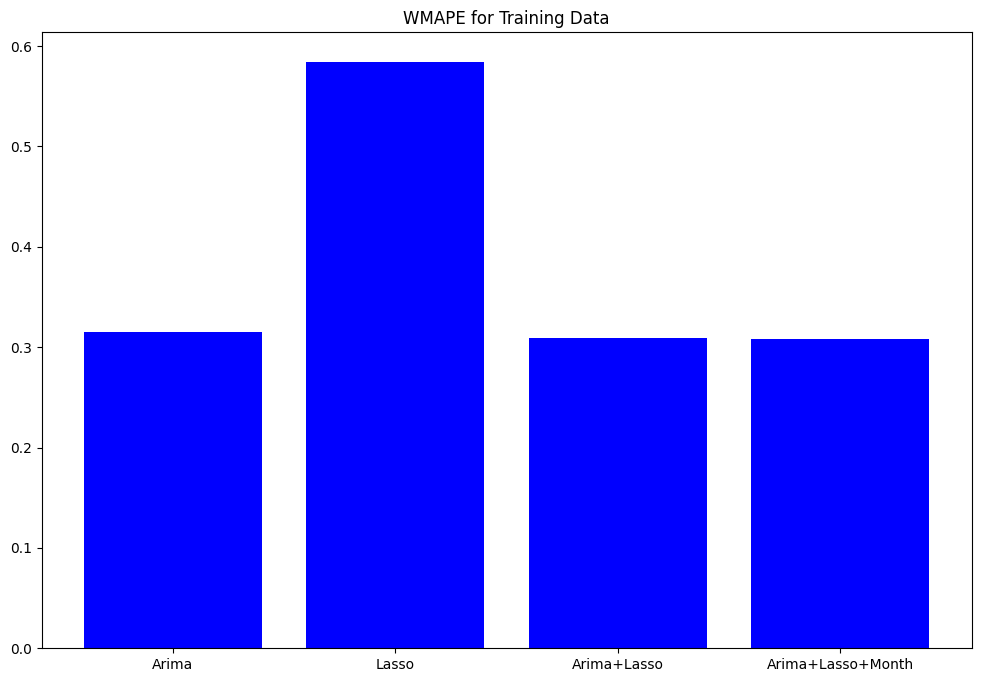

In [70]:
wmape_train = accuracy_train_df["WMAPE"]

plt.figure(figsize=(12, 8))
plt.bar(wmape_train.index, wmape_train, color='blue')
plt.title("WMAPE for Training Data")
plt.show()

ARIMA, the combined model and the combined model with month variable have very similar WMAPE values. Let's check MAPE too.

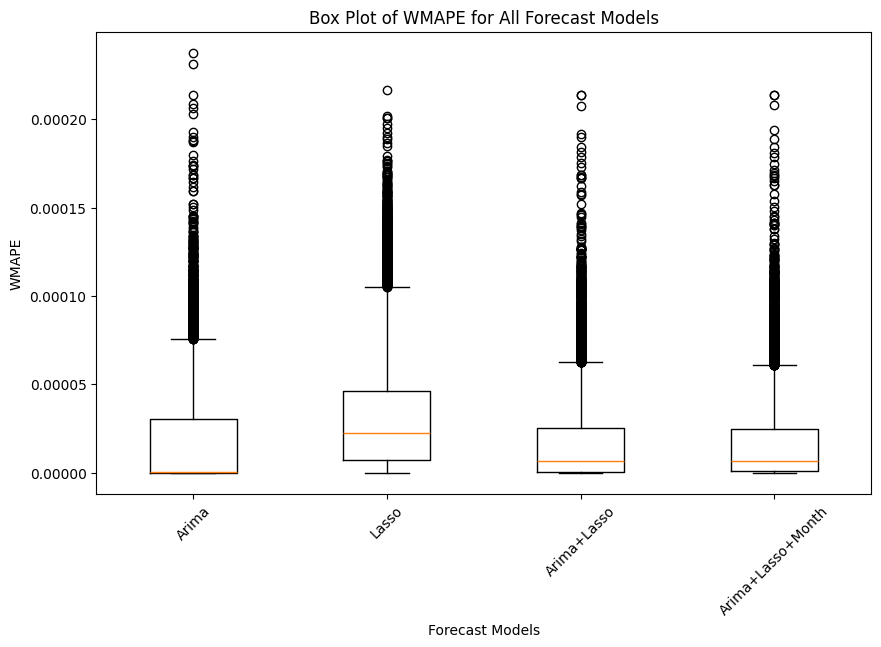

In [71]:
production_train = df_train["production"]

denominator = sum(production_train)

mape_values = {}

# Iterate over each forecast model and calculate MAPE
for model_name in forecasted_train_df.columns:
    forecast_values = forecasted_train_df[model_name]
    mape_lst = []
    for i in range(len(forecast_values)):
        mape_lst.append(np.abs(production_train[i] - forecast_values[i]) / denominator)
    mape_values[model_name] = mape_lst

# Create box plot for all MAPE values
plt.figure(figsize=(10, 6))
plt.boxplot(mape_values.values(), tick_labels=mape_values.keys())  
plt.title("Box Plot of WMAPE for All Forecast Models")
plt.xlabel("Forecast Models")
plt.ylabel("WMAPE")
plt.xticks(rotation=45)
plt.show()

As it can be seen from the box plots, all models are positivelt skewed. (Means are closer to left-end) Also, ARIMA model have the lowest mean, and it is followed by the combined model / combined model + month variable (they have nearly the same mean), and finally lasso regression. However, ARIMA model has a lot of outliers and the furthest outlier, so its errors might change a lot. The combined model and the combined model with month variables seem to have a similar pattern. They and Lasso regression have outliers until nearly the same point. But, Lasso regression's median-max range is longer than them. All models have the same minimum value, and Lasso regression has the highest maximum value and is followed by ARIMA, and the combined models. 

Let's check performance on the test set, too.

In [72]:
forecasted_test_df = pd.DataFrame(forecasted_test)

accuracy_test = []

# Calculate the error metrics for the test data
for col in forecasted_test_df.columns:
    accuracy_test.append(accu(df_test["production"], forecasted_test[col]))

accuracy_test_df = pd.concat(accuracy_test, ignore_index=True)
accuracy_test_df.index = forecasted_test_df.columns

accuracy_test_df

,n,mean,sd,CV,FBias,MAPE,RMSE,MAD,MADP,WMAPE
Arima,2688,2.600301,3.496188,1.344532,0.002229,0.198583,1.919275,0.947456,0.364364,0.364364
Lasso,2688,2.600301,3.496188,1.344532,-0.127096,0.933208,2.224446,1.784562,0.686290,0.686290
Arima+Lasso,2688,2.600301,3.496188,1.344532,-0.150969,0.703175,1.803095,1.398366,0.537771,0.537771
Arima+Lasso+Month,2688,2.600301,3.496188,1.344532,-0.134415,0.685622,1.810888,1.387751,0.533689,0.533689


ARIMA model underpredicts while the other overpredicts as in the train set. However, the case is different at MAD, MADP, WMAPE values. ARIMA works best at there, and is followed by the combined model + month, the combined model, and lastly lasso. As a whole, error metrices have higher values at the test set, but the performances of the combined models seem to decrease the most.

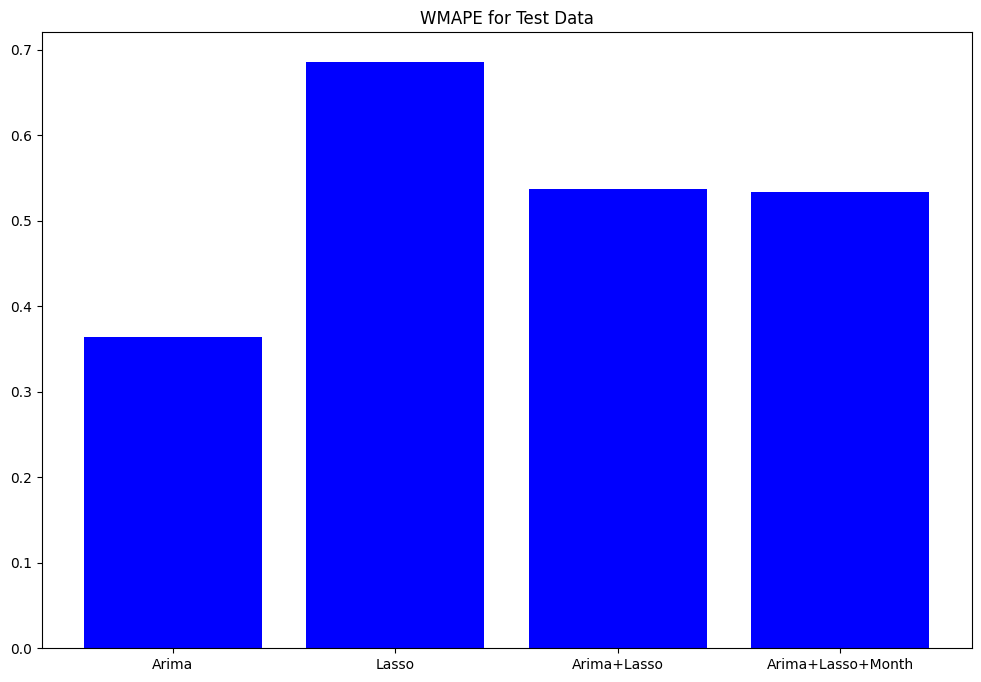

In [73]:
wmape_test = accuracy_test_df["WMAPE"]

plt.figure(figsize=(12, 8))
plt.bar(wmape_test.index, wmape_test, color='blue')
plt.title("WMAPE for Test Data")
plt.show()

ARIMA has the lowest WMAPE as it's said above and lasso regression model has the highest value.

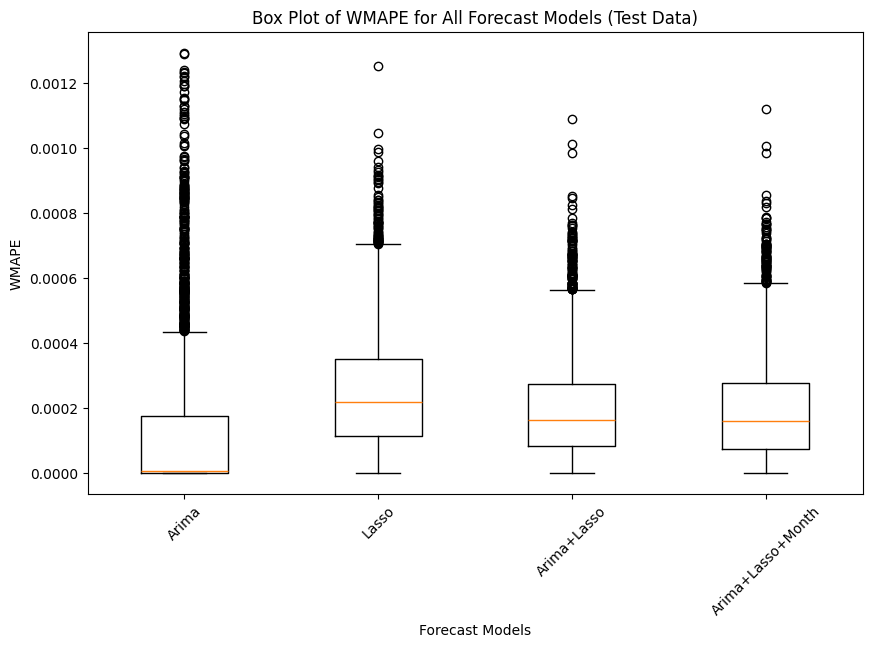

In [74]:
production_test = df_test["production"]

mape_values = {}

# Iterate over each forecast model and calculate MAPE
for model_name in forecasted_test_df.columns:
    forecast_values = forecasted_test_df[model_name]
    mape_lst = []
    # Ensure that production_test and forecast_values have the same length
    min_length = min(len(production_test), len(forecast_values))
    for actual, forecast in zip(production_test[:min_length], forecast_values[:min_length]):
        mape_lst.append(np.abs(actual - forecast) / sum(production_test))
    mape_values[model_name] = mape_lst

# Create box plot for all MAPE values
plt.figure(figsize=(10, 6))
plt.boxplot(mape_values.values(), tick_labels=mape_values.keys())  
plt.title("Box Plot of WMAPE for All Forecast Models (Test Data)")
plt.xlabel("Forecast Models")
plt.ylabel("WMAPE")
plt.xticks(rotation=45)
plt.show()


As in the train set data, all models are positively skewed. ARIMA model has the lowest mean and is followed by the combined models and lastly Lasso regression model. ARIMA model still has the furthest outlier but now the other models' furthest outliers seem close to it. It is followed by lasso, the combined model with month variables and lastly the combined model. The combined models seem very similar other than their furthest outliers. All models have the same minimum value, and the Lasso regression model has the highest maximum value. And it's followed by the combined models and ARIMA.

## 5. Conclusion and Future Work <a name="future"></a>

In conclusion, solar power has an importance role at producing energy, but because there're a lot of external factors which affect its performance, an effective forecasting model should be built. To achieve this objective, firstly an ARIMA model is built. Because it did not work very well, other methods were tried. Because there are a lot of variables, a penalized regression model is built to select among them. However, this model worked worse than ARIMA. Combination of different models might result in a better model, so the combined model is built. It worked slightly better than ARIMA in the error metrices sense. Adding dummy month variables improved a bit too. However, the combined model with month dummy variables have outlier further than the combined model. And they seem to have very similar results in error metrices. Therefore, the combined model is the final model. In the competition phase, because we wanted to see how they really work in real-life extent, all models are used in different days. Thus, WMAPE values changed a lot from day-to-day.

As it can be seen from the results, this approach did not work that well. To show another approach, an hourly model is showed above, but it has high error rates and depend mostly on lagged values. Relaying on lagged variables might be dangerous in forecasting setting and result in accumulation of errors. Another approach might be improving ARIMA model. It worked slightly worse than the combined model. Rather than combining it with penalized regression, variables affecting the production amount might be added such as monthly/daily dummy variables. Building very good hourly models can be a way too, but there're more than one models in that case, and all of their error in total create the daily error. Thus, hourly models should have smaller errors.

The main approach of this project and other ways to reach it are described above. The discussion finishes here and the related code files of the project can be found below.

## 6. Code <a name="code"></a>

Click here to see the Lasso+ARIMA model: [Lasso+ARIMA Code](https://github.com/BU-IE-360/spring24-lmfaraday/blob/main/Project/Codes/Lasso%2BARIMA%20Prediction.ipynb)

Click here to see the hourly model: [Hourly Model Code](https://github.com/BU-IE-360/spring24-lmfaraday/blob/main/Project/Codes/Hourly%20Model%20Prediction.ipynb)